https://www.kaggle.com/datasets/kabure/german-credit-data-with-risk

# Содержание:

**1. [Введение]** <br>
    - Описание данных <br>

**2. [Библиотеки]** <br>
    - Импорт библиотек <br>
    - Импорт данных <br>

**3. [Изучение данных]** <br>
    - 3.1 Поиск типа данных <br>
    - 3.2 Форма данных <br>
    - 3.3 Нулевые значения <br>
    - 3.4 Уникальные значения <br>
    - 3.5 Первые строки <br>

**4. [Визуализация данных]** <br>
    - 4.1 Составление графической и описательной информации <br>

**5. [Корреляция данных](# Correlation)** <br>
    - 5.1 Корреляционные данные <br>
    
**6. [Предварительная обработка]**<br>
    - 6.1 Импорт библиотек <br>
    - 6.2 Настройка X и Y <br>
    - 6.3 Разделение X и Y в обучении и тесте <br>
    
**7. 1 [Модель 1]** <br>
    - 7.1.1 Случайный лес <br>
    - 7.1.2 Определение качества <br>
    - 7.1.3 Кросс-валидация <br>
    
**7. 2 [Модель 2]** <br>
    - 7.2.1 Логистическая регрессия <br>
    - 7.2.2 Определение качества <br>
    - 7.2.3 Кросс-валидация <br>
    - 7.2.4 Кривая ROC<br>

<a id="Introduction"></a> <br>


# **1. Введение:**

<h2>О датасете</h2>

Исходный набор данных содержит 1000 записей с 20 категориальными / символическими атрибутами, подготовленными профессором Хофманном. В этом наборе данных каждая запись представляет человека, который берет кредит в банке. Каждый человек классифицируется как хороший или плохой кредитуемый в соответствии с набором атрибутов. 

Ссылка на исходный набор данных:  https://www.kaggle.com/datasets/kabure/german-credit-data-with-risk


<b>Age </b> (числовой) <br>
<b>Sex </b> (текст: мужчина, женщина) <br>
<b>Job </b> (числовой: 0 - неквалифицированный и нерезидент, 1 - неквалифицированный и резидент, 2 - квалифицированный, 3 - высококвалифицированный) <br>
<b>Housing</b> (текст: собственный, арендный или бесплатный) <br>
<b>Saving accounts</b> (текст - маленький, умеренный, довольно богатый, богатый) <br>
<b>Checking account </b> (текст, - маленький, умеренный, довольно богатый, богатый) <br>
<b>Credit amount</b> (числовой, в DM) <br>
<b>Duration</b> (числовой, в месяцах) <br>
<b>Purpose</b> (текст: автомобиль, мебель / оборудование, радио / ТВ, бытовая техника, ремонт, образование, бизнес, отдых / др. <br>
<b>Risk </b> (целевое значение - хороший или плохой риск) <br>

# **2. Подключение библиотек и импорт данных:**
- Импорт библиотек
- Импорт данных

In [1]:
#Load the librarys
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import plotly.figure_factory as ff
import warnings 


import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls 
import phik
import plotly.subplots as tls

from phik.report import plot_correlation_matrix
from collections import Counter 

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier


from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix


py.init_notebook_mode(connected=True) 
pd.options.display.max_columns = 100

In [2]:
#Importing the data
df_credit = pd.read_csv(r"C:\Users\johnw\german_credit_data (1).csv",index_col=0)
df_credit.head()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
0,67,male,2,own,NaN,little,1169,6,radio/TV,good
1,22,female,2,own,little,moderate,5951,48,radio/TV,bad
2,49,male,1,own,little,NaN,2096,12,education,good
3,45,male,2,free,little,little,7882,42,furniture/equipment,good
4,53,male,2,free,little,little,4870,24,car,bad


<h2>Служебные функции</h2>

In [3]:
RANDOM_STATE = 345777

In [4]:
def feature_type(df):
     #Finding numeric and categorical features
    numeric_types = ['in16', 'int32', 'int64', 'float16', 'float32', 'float64']
    numeric = []
    categorical = []
    for clmn in df.columns:
        if df[clmn].dtype == object or df[clmn].dtype == 'category'or df[clmn].dtype == bool:
            categorical.append(clmn)
        elif df[clmn].dtype in numeric_types:
            numeric.append(clmn)
        else:
            print(f'The {clmn} column with type {df[clmn].dtype} is not recognised')
    return(numeric, categorical)

In [5]:
def first_look(df):

    numeric, categorical = feature_type(df)

    print('\n'*2)
    for i in range(4):
        print('='*79)

    print('='*25, '5 случайных строк датасета', '='*26)
    print('='*79)
    display(df.sample(5, random_state=RANDOM_STATE))

    print('='*79)
    print('='*30, 'Размеры датасета', '='*31)
    print('='*79)
    display(df.shape)

    print('='*79)
    print('='*28, 'Информация о датасетe', '='*28)
    print('='*79)
    df.info()

    print('='*79)
    print('='*20, 'Информация о количественных признаках', '='*20)
    print('='*79)
    try:
        display(df[numeric].describe())
    except:
        print('\n')
        print('Количественные признаки отсутствуют')
        print('\n')

    print('='*79)
    print('='*21, 'Информация о качественных признаках', '='*21)
    print('='*79)
    try:
        display(df[categorical].describe())
    except:
        print('\n')
        print('Качественные признаки отсутствуют')
        print('\n')
        
    print('='*79)      
    print('='*21, 'Информация об уникальных признаках', '='*21)
    print('='*79)
    print(df.nunique())
    
    print('='*79)
    print('='*23, 'Число явных дубликатов', '='*32)
    print('='*79)
    display(df.duplicated().sum())
    
    
    print('='*79)
    print('='*28, 'Информация о NaN', '='*30)
    print('='*79)
    
    missing = df.isnull().sum()

    #Get the percentage of missing values in each column
    missing_pct = round(df.isnull().sum()/len(df) * 100, 1)

    data_missing = pd.concat([missing, missing_pct], axis=1)
    data_missing.columns = ["Num", "Percent"]
    print(data_missing)

    #Plot missing values
    data_missing['Percent'].plot(kind= "bar")
    plt.show()
    
    

    for i in range(4):
        print('='*79)

In [6]:
def values_explore(df, columns):
    for col in columns:
        print(df[col].value_counts(), '\n')

In [7]:
def plot_target_variable_distribution(df, 
                                      target_column1, 
                                      target_variable,
                                      target_variable1,
                                      target_column='Risk'):
    trace0 = go.Bar(
        x=df[df[target_column] == target_variable][target_column1].value_counts().index.values,
        y=df[df[target_column] == target_variable][target_column1].value_counts().values,
        name=target_variable.capitalize() + ' credit'
    )
    
    trace1 = go.Bar(
        x=df[df[target_column] == target_variable1][target_column1].value_counts().index.values,
        y=df[df[target_column] == target_variable1][target_column1].value_counts().values,
        name=target_variable1.capitalize() + ' credit'
    )

    data = [trace0, trace1]

    layout = go.Layout(
        yaxis=dict(title='Count'),
        xaxis=dict(title=target_column1.capitalize()),
        title='Target variable distribution'
    )

    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

In [8]:
def age_vs_cats(df, figsize=(10, 20), exceptions=None):
    categorical = []
    for clmn in df.columns:
        if clmn not in exceptions and df[clmn].dtype == object or df[clmn].dtype == 'category':
            categorical.append(clmn)

    fig = plt.figure(figsize=figsize, layout='constrained')
    for i, clmn in enumerate(categorical):
        fig.add_subplot(len(categorical) // 2 + 1, 2, i+1)
        sns.scatterplot(df.groupby(['Age', clmn])[clmn].count().reset_index(name='Count'),
                        x='Age', y='Count', hue=clmn)
        plt.ylabel(f'{clmn} count')
        plt.title(f'Age vs {clmn}. Scatterplot')

In [9]:
def age_vs_nums(df, figsize=(10, 8), exceptions=[]):
    numeric_types = ['in16', 'int32', 'int64', 'float16', 'float32', 'float64']
    numeric = []
    for clmn in df.columns:
        if clmn not in exceptions and df[clmn].dtype in numeric_types:
            numeric.append(clmn)

    fig = plt.figure(figsize=figsize, layout='constrained')
    for i, clmn in enumerate(numeric):
        fig.add_subplot(len(numeric) // 2 + 1, 2, i+1)
        sns.scatterplot(df, x='Age', y=clmn, alpha=0.3)
        plt.ylabel(f'{clmn}')
        plt.title(f'Age vs {clmn}. Scatterplot')

In [10]:
def risk_vs_cats(df, figsize=(10, 20), exceptions=None):
    categorical = []
    for clmn in df.columns:
        if clmn not in exceptions and (df[clmn].dtype == object or df[clmn].dtype == 'category'):
            categorical.append(clmn)

    fig = plt.figure(figsize=figsize, layout='constrained')
    for i, clmn in enumerate(categorical):
        fig.add_subplot(len(categorical) // 2 + 1, 2, i+1)
        sns.barplot(data=df.groupby(['Risk', clmn])[clmn].count().reset_index(name='Count'),
                    x=clmn, y='Count', hue='Risk')
        plt.ylabel(f'Risk {clmn} count')
        plt.xticks(rotation=(30))
        plt.title(f'Risk vs {clmn} Barplot')

In [11]:
def risk_vs_cats_normed(df, figsize=(10, 20), exceptions=None):
    categorical = []
    for clmn in df.columns:
        if clmn not in exceptions and (df[clmn].dtype == object or df[clmn].dtype == 'category'):
            categorical.append(clmn)

    fig = plt.figure(figsize=figsize, layout='constrained')
    for i, clmn in enumerate(categorical):
        fig.add_subplot(len(categorical) // 2 + 1, 2, i+1)
        
        # Normalize the counts
        normalized_counts = (df.groupby(['Risk', clmn])[clmn].count() / df.groupby('Risk')[clmn].count()).reset_index(name='Normalized_Count')
        
        sns.barplot(data=normalized_counts,
                    x=clmn, y='Normalized_Count', hue='Risk')
        
        plt.ylabel(f'Normalized Risk {clmn} count')
        plt.xticks(rotation=(30))
        plt.title(f'Normalized Risk vs {clmn} Barplot')


In [12]:
def risk_vs_nums(df, figsize=(10, 6), exceptions=[]):
    numeric_types = ['in16', 'int32', 'int64', 'float16', 'float32', 'float64']
    numeric = []
    for clmn in df.columns:
        if clmn not in exceptions and df[clmn].dtype in numeric_types:
            numeric.append(clmn)

    fig = plt.figure(figsize=figsize, layout='constrained')
    for i, clmn in enumerate(numeric):
        fig.add_subplot(len(numeric) // 2 + 1, 2, i+1)
        sns.scatterplot(df, x='Credit amount', y=clmn, hue='Risk', alpha=0.4)
        plt.ylabel(f'{clmn}')
        plt.title(f'Credit amount vs {clmn} Scatterplot')

In [13]:
def corr_matrix(df, interval_cols=[]):
    phik_overview = df.phik_matrix(interval_cols=interval_cols).round(2)

    plot_correlation_matrix(phik_overview.values, 
                            x_labels=phik_overview.columns, 
                            y_labels=phik_overview.index, 
                            vmin=0, vmax=1, color_map='coolwarm', 
                            title=r'Correlation $\phi_K$', 
                            fontsize_factor=1, 
                            figsize=(12, 7))
    plt.tight_layout()
    plt.show()

In [14]:
def calculate_tpr_fpr(y_real, y_pred):
    # Calculates the confusion matrix and recover each element
    cm = confusion_matrix(y_real, y_pred)
    TN = cm[0, 0]
    FP = cm[0, 1]
    FN = cm[1, 0]
    TP = cm[1, 1]
    # Calculates tpr and fpr
    tpr =  TP/(TP + FN) # sensitivity - true positive rate
    fpr = 1 - TN/(TN+FP) # 1-specificity - false positive rate
    
    return tpr, fpr

In [15]:
def get_n_roc_coordinates(y_real, y_proba, n = 50):
    tpr_list = [0]
    fpr_list = [0]
    for i in range(n):
        threshold = i/n
        y_pred = y_proba[:, 1] > threshold
        tpr, fpr = calculate_tpr_fpr(y_real, y_pred)
        tpr_list.append(tpr)
        fpr_list.append(fpr)
    return tpr_list, fpr_list

In [16]:
def plot_roc_curve(tpr, fpr, scatter = True, md_name = 'model'):
    plt.figure(figsize = (5, 5))
    if scatter:
        sns.scatterplot(x = fpr, y = tpr)
    else:
        sns.lineplot(x = fpr, y = tpr)
    sns.lineplot(x = fpr, y = tpr)
    sns.lineplot(x = [0, 1], y = [0, 1], color = 'green')
    plt.title(f'ROC-AUC curve of {md_name}')
    plt.xlim(-0.05, 1.05)
    plt.ylim(-0.05, 1.05)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")

# 3. **Первичный анализ**




========================= 5 случайных строк датасета ==========================


,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk
21,44,male,2,rent,quite rich,little,2647,6,radio/TV,good
562,29,female,2,own,little,rich,683,6,radio/TV,good
526,31,female,2,own,moderate,NaN,1532,15,education,good
700,29,female,1,rent,quite rich,NaN,1123,12,furniture/equipment,bad
57,31,female,2,own,little,NaN,9566,36,radio/TV,good


============================== Размеры датасета ===============================


(1000, 10)

============================ Информация о датасетe ============================
<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Age               1000 non-null   int64 
 1   Sex               1000 non-null   object
 2   Job               1000 non-null   int64 
 3   Housing           1000 non-null   object
 4   Saving accounts   817 non-null    object
 5   Checking account  606 non-null    object
 6   Credit amount     1000 non-null   int64 
 7   Duration          1000 non-null   int64 
 8   Purpose           1000 non-null   object
 9   Risk              1000 non-null   object
dtypes: int64(4), object(6)
memory usage: 85.9+ KB
==================== Информация о количественных признаках ====================


,Age,Job,Credit amount,Duration
count,1000.000000,1000.000000,1000.000000,1000.000000
mean,35.546000,1.904000,3271.258000,20.903000
std,11.375469,0.653614,2822.736876,12.058814
min,19.000000,0.000000,250.000000,4.000000
25%,27.000000,2.000000,1365.500000,12.000000
50%,33.000000,2.000000,2319.500000,18.000000
75%,42.000000,2.000000,3972.250000,24.000000
max,75.000000,3.000000,18424.000000,72.000000


===================== Информация о качественных признаках =====================


,Sex,Housing,Saving accounts,Checking account,Purpose,Risk
count,1000,1000,817,606,1000,1000
unique,2,3,4,3,8,2
top,male,own,little,little,car,good
freq,690,713,603,274,337,700


===================== Информация об уникальных признаках =====================
Age                  53
Sex                   2
Job                   4
Housing               3
Saving accounts       4
Checking account      3
Credit amount       921
Duration             33
Purpose               8
Risk                  2
dtype: int64
======================= Число явных дубликатов ================================


0

============================ Информация о NaN ==============================
                  Num  Percent
Age                 0      0.0
Sex                 0      0.0
Job                 0      0.0
Housing             0      0.0
Saving accounts   183     18.3
Checking account  394     39.4
Credit amount       0      0.0
Duration            0      0.0
Purpose             0      0.0
Risk                0      0.0


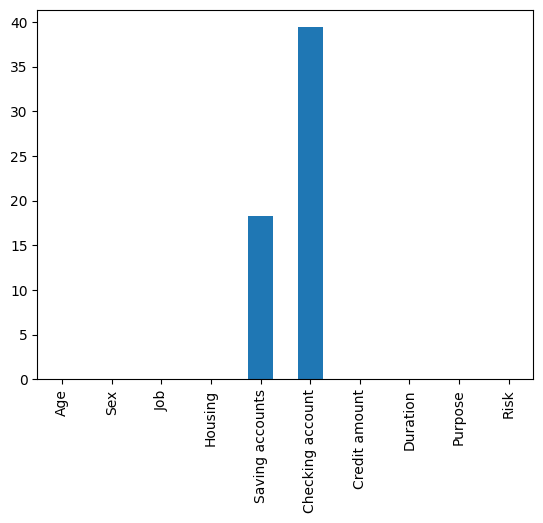

In [17]:
first_look(df_credit)

In [18]:
print('count Raws to drop : ', df_credit[(df_credit['Saving accounts'].isna()) & (df_credit['Checking account'].isna())].shape[0])

count Raws to drop :  99


Есть строки , где у клиента нет ни saving ни checking счета а точнее, мы не имеем данных о их наличии.

Это относится к строкам где (Saving accounts & Saving accounts) == NaN

Становится не совсем ясным как банк выдает кредит без счета?

In [19]:
print('Количество клиентов с обоими разновидностями счетов: ', df_credit[(df_credit['Saving accounts'].notna()) & (df_credit['Checking account'].notna())].shape[0])

Количество клиентов с обоими разновидностями счетов:  522


In [20]:
print('Количество клиентов хотя бы с одним счетом : ', df_credit[(df_credit['Saving accounts'].notna()) | (df_credit['Checking account'].notna())].shape[0])

Количество клиентов хотя бы с одним счетом :  901


 ### Вывод по разделу

Предоставленные данные не имеюют серьезных изъянов, дают довольно подробную информацию о клиенте. Типы данных соответствуют смыслу столбцов. 

Можно исправить -- преобразовать NaN values из столбцов Saving accounts и Checking account в отдельную категорию так как они занимают значимую часть в датасете. Из зравого смысла отсутсвующие значения означают отсутсвие счета.

* Saving accounts -- 18.3%  
* Checking account -- 39.4%  

Значениям == NaN присвоим отдельную категорию 'no_acc' показывающая что счета нет.

Строки в которых  (Saving accounts & Saving accounts) == 'no_acc' дропнем позже , потому что они могут содержать полезную для исследования информацию.

Также можно преобразовать object type в categorial чтобы улучшить производительность. 

А Job нужно обязательно преобразовать в categorial type из int64.


In [21]:
df_credit['Job']

0      2
1      2
2      1
3      2
4      2
      ..
995    1
996    3
997    2
998    2
999    2
Name: Job, Length: 1000, dtype: int64

# **4. Разведочный анализ данных** 


## Начало анализа

In [22]:
values_explore(df_credit,['Purpose','Sex','Job','Checking account','Saving accounts','Risk'])

Purpose
car                    337
radio/TV               280
furniture/equipment    181
business                97
education               59
repairs                 22
domestic appliances     12
vacation/others         12
Name: count, dtype: int64 

Sex
male      690
female    310
Name: count, dtype: int64 

Job
2    630
1    200
3    148
0     22
Name: count, dtype: int64 

Checking account
little      274
moderate    269
rich         63
Name: count, dtype: int64 

Saving accounts
little        603
moderate      103
quite rich     63
rich           48
Name: count, dtype: int64 

Risk
good    700
bad     300
Name: count, dtype: int64 



In [23]:
print(df_credit['Checking account'].value_counts().sum())
print(df_credit['Saving accounts'].value_counts().sum())

606
817


* Виден перевес в данных по полу, мужчин представлено примерно в два раза больше
* Больше информации о хорошем заемщике, чем о плохом. Делаем вывод что сигналом в таргете будет именно плохой заемшик.
* Сберегательных счетов в банке больше чем checking.
* У Checking аккаунта отсутвует категория quite rich 
* Больше всего кредитов берут на машины, элеткронику а также мебель с спец.оборудованием

## Формирование столбца с таргетом

Столбец **Risk** содержит значения 'good' и 'bad' , которые можно заменить бинарным представлением.
Поскольку банку важнее получить сигнал о нежательном кредитовании, представим bad risk как 1, соотвественно good == 0.

In [24]:
df_credit['Signal'] = 0
df_credit.loc[df_credit.Risk == 'good', 'Signal'] = 0
df_credit.loc[df_credit.Risk != 'good', 'Signal'] = 1

In [25]:
df_credit.sample(2)

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk,Signal
548,24,female,1,own,little,little,626,12,radio/TV,bad,1
862,35,female,2,own,little,little,2439,24,radio/TV,bad,1


## Работа с типами данных

In [26]:
df_credit.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Age               1000 non-null   int64 
 1   Sex               1000 non-null   object
 2   Job               1000 non-null   int64 
 3   Housing           1000 non-null   object
 4   Saving accounts   817 non-null    object
 5   Checking account  606 non-null    object
 6   Credit amount     1000 non-null   int64 
 7   Duration          1000 non-null   int64 
 8   Purpose           1000 non-null   object
 9   Risk              1000 non-null   object
 10  Signal            1000 non-null   int64 
dtypes: int64(5), object(6)
memory usage: 93.8+ KB


In [27]:
object_columns = df_credit.select_dtypes(include=['object']).columns
object_columns

Index(['Sex', 'Housing', 'Saving accounts', 'Checking account', 'Purpose',
       'Risk'],
      dtype='object')

In [28]:
df_credit[object_columns] = df_credit[object_columns].astype('category')

In [29]:
df_credit['Job'] = df_credit['Job'].astype('category')

In [30]:
df_credit.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Age               1000 non-null   int64   
 1   Sex               1000 non-null   category
 2   Job               1000 non-null   category
 3   Housing           1000 non-null   category
 4   Saving accounts   817 non-null    category
 5   Checking account  606 non-null    category
 6   Credit amount     1000 non-null   int64   
 7   Duration          1000 non-null   int64   
 8   Purpose           1000 non-null   category
 9   Risk              1000 non-null   category
 10  Signal            1000 non-null   int64   
dtypes: category(7), int64(4)
memory usage: 47.2 KB


## Заполнение пропусков

Обычно заполнение пропусков производится после анализа данных, но в данном случае справедливо будет сначала избавиться от пропусков, поскольку их природа вполне ясна и имеет смысл учесть значения при анализе.

In [31]:
na = df_credit.isna().sum()[df_credit.isna().sum() != 0]
na

Saving accounts     183
Checking account    394
dtype: int64

In [32]:
for clmn in na.index.to_list():
    df_credit[clmn] = df_credit[clmn].cat.add_categories(['no_acc'])  # Добавляем новую категорию "no_acc"
    df_credit[clmn] = df_credit[clmn].fillna('no_acc')

In [33]:
nac = len(df_credit.isna().sum()[df_credit.isna().sum() != 0])
if nac == 0:
    print('Пропуски заполненны')
df_credit.sample(3)

Пропуски заполненны


,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk,Signal
493,38,male,2,own,no_acc,moderate,368,6,radio/TV,good,0
759,35,male,2,own,little,little,691,12,car,bad,1
334,23,male,2,rent,little,little,4110,24,furniture/equipment,bad,1


Помним что есть кредиты выданные людям не имеющие ни одного из счетов

In [34]:
noAcc = df_credit[(df_credit['Saving accounts'] == 'no_acc') & (df_credit['Checking account'] == 'no_acc')]
noAcc['Risk'].value_counts(normalize=True)*100

Risk
good    90.909091
bad      9.090909
Name: proportion, dtype: float64

In [35]:
noAcc['Risk'].value_counts()

Risk
good    90
bad      9
Name: count, dtype: int64

Причем только в 9 из 99 этих случаев, кредитный риск оказался с меткой **bad**

In [36]:
noAcc[noAcc['Risk'] == 'bad']

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk,Signal
80,44,female,2,own,no_acc,no_acc,5943,24,radio/TV,bad,1
92,33,female,1,own,no_acc,no_acc,797,12,radio/TV,bad,1
175,53,female,3,own,no_acc,no_acc,7485,30,car,bad,1
505,27,male,1,own,no_acc,no_acc,1309,10,car,bad,1
557,29,female,2,own,no_acc,no_acc,5003,21,car,bad,1
622,38,male,2,own,no_acc,no_acc,3914,48,business,bad,1
645,27,male,2,rent,no_acc,no_acc,7980,36,business,bad,1
763,30,male,3,free,no_acc,no_acc,12680,21,car,bad,1
846,68,male,2,rent,no_acc,no_acc,6761,18,car,bad,1


Видим что выдавались долгосрочные кредиты с большим размером кредитования. Это может означать что та группа клиентов, которые не имели счета ни в Saving accounts ни в Checking account не ошибка в данных, а скорее всего являются новоприбвшими клиентами. Их следует выделить в отдельную группу.

Причем мы видим что в представленной группе 90% кредитов имеют Risk == Good. Интересно.

## Графическое исследование данных

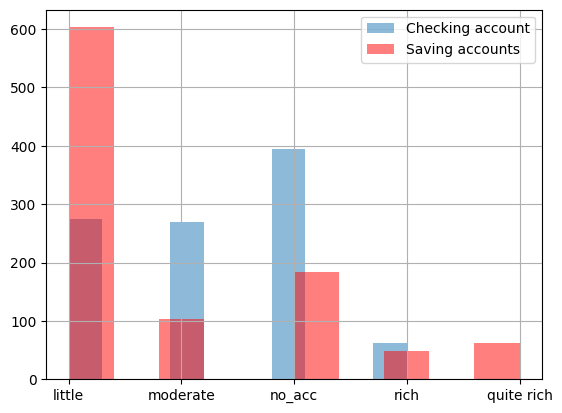

In [37]:
num_bins = 10  

df_credit['Checking account'].hist(bins=num_bins, alpha=0.5, label='Checking account')
df_credit['Saving accounts'].hist(bins=num_bins, alpha=0.5, color = 'r',label='Saving accounts')
plt.legend()

С кредитом связывались больше люди с небольшими сберегательными счетами.

### Распределение таргета

In [38]:
plot_target_variable_distribution(df_credit,'Risk','good','bad')

### Исследование возрастных зависимостей

In [39]:
df_age = df_credit['Age'].values.tolist()

age_trace = go.Histogram(
    x=df_age,
    histnorm='probability',
    name="Возраст"
)

layout = go.Layout(
    yaxis=dict(title='Count'),
    xaxis=dict(title='Age Variable'),
    title='Распределение Age'
)


fig = go.Figure(data=age_trace,layout=layout)
fig['layout'].update(showlegend=True, title='Age Distribuition', bargap=0.05)

py.iplot(fig, filename='age_dist')

Создадим возрастаные группы исходя из распределения и зравого смысла.

In [40]:
#Let's look the Credit Amount column
interval = (18, 23, 27, 37, 48, 54, 59, 120)

cats = ['Students_18-23', 'Young-24-27', 'Adult_28-37', 'Juicy-38_48','BecomeOld_49-54','Old_55-59','Senior_60+']
df_credit["Age_cat"] = pd.cut(df_credit.Age, interval, labels=cats)

df_credit.sample(3)

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk,Signal,Age_cat
214,51,male,2,own,no_acc,no_acc,3342,36,radio/TV,good,0,BecomeOld_49-54
817,24,female,2,rent,little,no_acc,1554,6,radio/TV,good,0,Young-24-27
714,27,male,3,own,little,moderate,14027,60,car,bad,1,Young-24-27


In [41]:
# Age Group Segments
students_good = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Students_18-23') & (df_credit['Risk'] == 'good')].sum()
students_bad = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Students_18-23') & (df_credit['Risk'] == 'bad')].sum()
young_good = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Young-24-27') & (df_credit['Risk'] == 'good')].sum()
young_bad = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Young-24-27') & (df_credit['Risk'] == 'bad')].sum()
adult_good = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Adult_28-37') & (df_credit['Risk'] == 'good')].sum()
adult_bad = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Adult_28-37') & (df_credit['Risk'] == 'bad')].sum()
juicy_good = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Juicy-38_48') & (df_credit['Risk'] == 'good')].sum()
juicy_bad = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Juicy-38_48') & (df_credit['Risk'] == 'bad')].sum()
become_old_good = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'BecomeOld_49-54') & (df_credit['Risk'] == 'good')].sum()
become_old_bad = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'BecomeOld_49-54') & (df_credit['Risk'] == 'bad')].sum()
old_good = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Old_55-59') & (df_credit['Risk'] == 'good')].sum()
old_bad = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Old_55-59') & (df_credit['Risk'] == 'bad')].sum()
senior_good = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Senior_60+') & (df_credit['Risk'] == 'good')].sum()
senior_bad = df_credit['Credit amount'].loc[(df_credit['Age_cat'] == 'Senior_60+') & (df_credit['Risk'] == 'bad')].sum()

# Percents
students_good_p = students_good / (students_good + students_bad) * 100
students_bad_p = students_bad / (students_good + students_bad) * 100
young_good_p = young_good / (young_good + young_bad) * 100
young_bad_p = young_bad / (young_good + young_bad) * 100
adult_good_p = adult_good / (adult_good + adult_bad) * 100
adult_bad_p = adult_bad / (adult_good + adult_bad) * 100
juicy_good_p = juicy_good / (juicy_good + juicy_bad) * 100
juicy_bad_p = juicy_bad / (juicy_good + juicy_bad) * 100
become_old_good_p = become_old_good / (become_old_good + become_old_bad) * 100
become_old_bad_p = become_old_bad / (become_old_good + become_old_bad) * 100
old_good_p = old_good / (old_good + old_bad) * 100
old_bad_p = old_bad / (old_good + old_bad) * 100
senior_good_p = senior_good / (senior_good + senior_bad) * 100
senior_bad_p = senior_bad / (senior_good + senior_bad) * 100

# Round Percents
students_good_p = str(round(students_good_p, 2))
students_bad_p = str(round(students_bad_p, 2))
young_good_p = str(round(young_good_p, 2))
young_bad_p = str(round(young_bad_p, 2))
adult_good_p = str(round(adult_good_p, 2))
adult_bad_p = str(round(adult_bad_p, 2))
juicy_good_p = str(round(juicy_good_p, 2))
juicy_bad_p = str(round(juicy_bad_p, 2))
become_old_good_p = str(round(become_old_good_p, 2))
become_old_bad_p = str(round(become_old_bad_p, 2))
old_good_p = str(round(old_good_p, 2))
old_bad_p = str(round(old_bad_p, 2))
senior_good_p = str(round(senior_good_p, 2))
senior_bad_p = str(round(senior_bad_p, 2))



x = ['Students_18-23', 'Young-24-27', 'Adult_28-37', 'Juicy-38_48','BecomeOld_49-54','Old_55-59','Senior_60+']

good_loans = go.Bar(
    x=x,
    y=[students_good, young_good, adult_good, juicy_good, become_old_good, old_good, senior_good],
    name="Good ",
    text=[students_good_p + '%', young_good_p + '%', adult_good_p + '%', juicy_good_p + '%', become_old_good_p + '%', old_good_p + '%', senior_good_p + '%'],
    textposition='auto',
    marker=dict(
        color='rgb(111, 235, 146)',
        line=dict(
            color='rgb(60, 199, 100)',
            width=1.5),
        ),
    opacity=0.6
)

bad_loans = go.Bar(
    x=x,
    y=[students_bad, young_bad, adult_bad, juicy_bad, become_old_bad, old_bad, senior_bad],
    name="Bad ",
    text=[students_bad_p + '%', young_bad_p + '%', adult_bad_p + '%', juicy_bad_p + '%', become_old_bad_p + '%', old_bad_p + '%', senior_bad_p + '%'],
    textposition='auto',
    marker=dict(
        color='rgb(247, 98, 98)',
        line=dict(
            color='rgb(225, 56, 56)',
            width=1.5),
        ),
    opacity=0.6
)

data = [good_loans, bad_loans]

layout = dict(
    title="Type by Age Group", 
    xaxis = dict(title="Age Group"),
    yaxis= dict(title="Credit Amount")
)

fig = dict(data=data, layout=layout)

py.iplot(fig, filename='grouped-bar-direct-labels')

Самые стабильные группы к выплате кредита это Adult и Juicy.

Резюме:
* Молодые возрастные группы чаще всего запрашивали немного большие кредиты по сравнению с более старшими возрастными группами.

* Молодежь и пожилые группы имели самую высокую долю кредитов с высоким риском. 45,29% всех клиентов, которые относятся к молодежной возрастной группе, рассматриваются как кредиты с высоким риском.

* Количество кредитов, рассматриваемых как кредиты с высоким риском в пожилой группе, составляет 44,28% от общего количества людей, учитываемых в пожилой группе.

Интересно, что эти группы наиболее вероятно безработны или работают неполный рабочий день, поскольку самая молодая группа либо не имеет достаточного опыта для работы, либо учится в университете, чтобы иметь возможность работать на полную ставку.

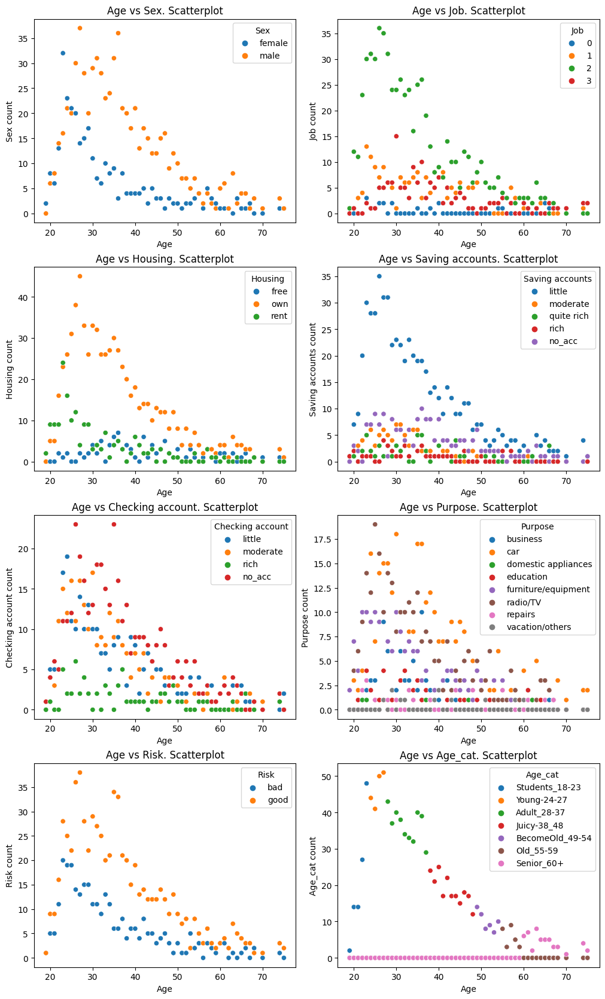

In [42]:
age_vs_cats(df_credit, figsize=(10, 20), exceptions=['Signal'])

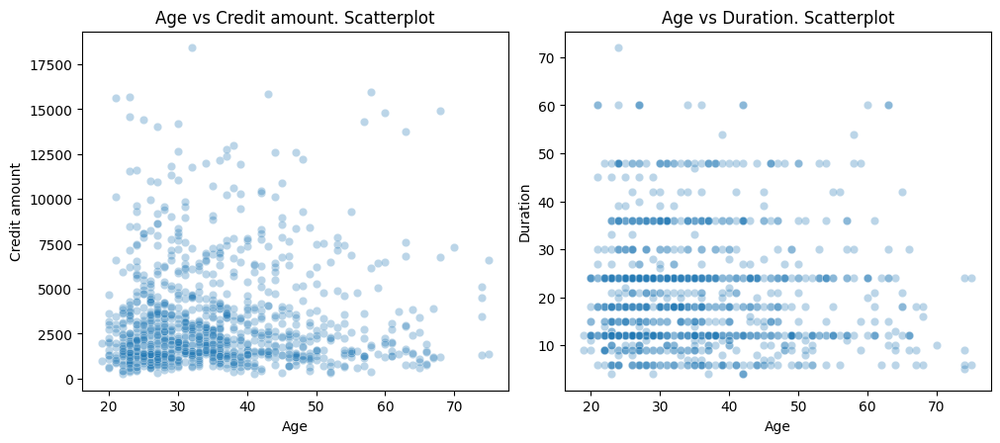

In [43]:
age_vs_nums(df_credit,exceptions=['Signal','Age'])

In [44]:
plot_target_variable_distribution(df_credit,'Age','good','bad')

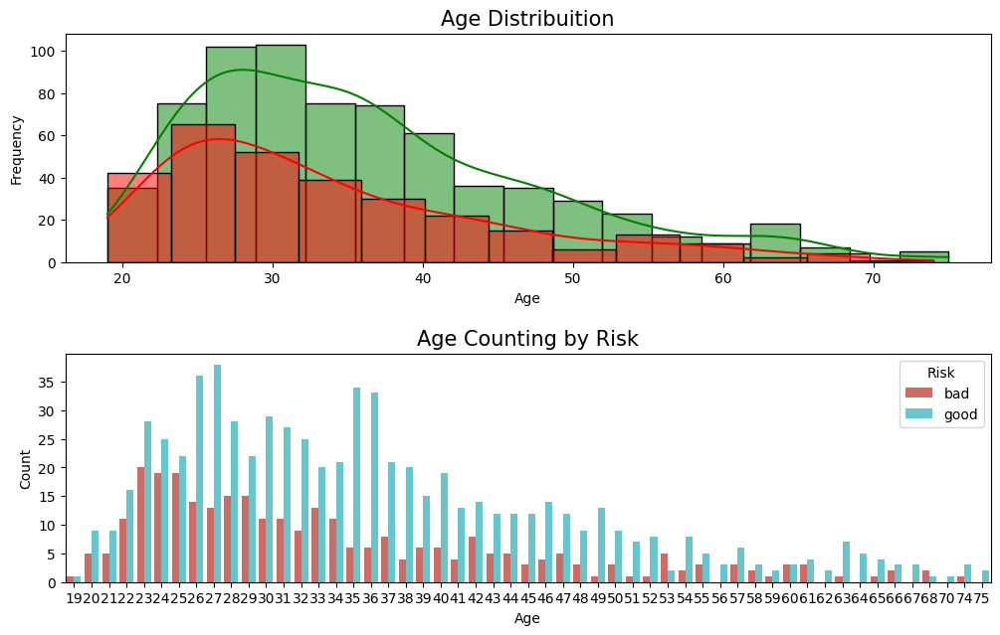

In [45]:
df_good = df_credit[df_credit["Risk"] == 'good']
df_bad = df_credit[df_credit["Risk"] == 'bad']

#Double hist plot
fig, ax = plt.subplots(nrows=2, figsize=(12,8))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g1 = sns.histplot(df_good["Age"], ax=ax[0],color="g",kde=True)
g1 = sns.histplot(df_bad["Age"], ax=ax[0],color='r',kde=True)

g1.set_title("Age Distribuition", fontsize=15)
g1.set_xlabel("Age")
g1.set_ylabel("Frequency")



#Count plot
g2 = sns.countplot(x="Age",data=df_credit,
              palette="hls", ax=ax[1],
              hue = "Risk")

g2.set_title("Age Counting by Risk", fontsize=15)
g2.set_xlabel("Age")
g2.set_ylabel("Count")
plt.show()

<h3>Распределение суммы кредитования по типу жилья </h3>

free - живут бесплатно  
own - собственное жилье  
rent - снимают  

In [46]:
plot_target_variable_distribution(df_credit,'Housing','good','bad')

Как мы видим хороший кредит ( тот который вернут обратно банку ) хорошо представленн в данных у людей с собственным жильем.

Интересная картина , тип жилья оказывает влияние на сумму кредитования.

### Посмотрим что с полом -- sex explore

In [47]:
df_bad["Sex"].value_counts()

Sex
male      191
female    109
Name: count, dtype: int64

In [48]:
df_good = df_credit[df_credit["Risk"] == 'good']
df_bad = df_credit[df_credit["Risk"] == 'bad']

#First plot
trace0 = go.Bar(
    x = df_good["Sex"].value_counts().index.values,
    y = df_good["Sex"].value_counts().values,
    name='Good credit'
)

#First plot 2
trace1 = go.Bar(
    x = df_bad["Sex"].value_counts().index.values,
    y = df_bad["Sex"].value_counts().values,
    name="Bad Credit"
)

#Second plot
trace2 = go.Box(
    x = df_good["Sex"],
    y = df_good["Credit amount"],
    name=trace0.name
)

#Second plot 2
trace3 = go.Box(
    x = df_bad["Sex"],
    y = df_bad["Credit amount"],
    name=trace1.name
)

data = [trace0, trace1, trace2,trace3]


fig = tls.make_subplots(rows=1, cols=2,
                        subplot_titles=('Sex Count', 'Credit Amount by Sex'))

fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 2)

fig['layout'].update(height=400, width=800, title='Sex Distribuition', boxmode='group')
py.iplot(fig, filename='sex-subplot')

В представленном наборе данных больше мужчин чем женщин

### Cчета

#### Checking accounts

In [49]:
cross_checking = pd.crosstab(df_credit['Risk'], df_credit['Checking account']).apply(lambda x: x/x.sum() * 100)
decimals = pd.Series([2,2,2,2], index=['little', 'moderate', 'rich','no_acc'])

cross_checking = cross_checking.round(decimals)
cross_checking

Checking account,little,moderate,rich,no_acc
Risk,,,,
bad,49.27,39.03,22.22,11.68
good,50.73,60.97,77.78,88.32


In [50]:
checking_percentage_distribution = df_credit['Checking account'].value_counts(normalize=True) * 100

fig = px.bar(
    x=checking_percentage_distribution.index,
    y=checking_percentage_distribution.values,
    labels={'x': 'Checking Account', 'y': 'Percentage (%)'},
    title='Checking Account Distribution in Percentage'
)

fig.show()

In [51]:
checking_percentage_distribution

Checking account
no_acc      39.4
little      27.4
moderate    26.9
rich         6.3
Name: proportion, dtype: float64

no_acc это бывшие NaN значения

In [52]:
bad_little = cross_checking['little'][0]
good_little = cross_checking['little'][1]
bad_moderate = cross_checking['moderate'][0]
good_moderate = cross_checking['moderate'][1]
bad_rich = cross_checking['rich'][0]
good_rich = cross_checking['rich'][1]
bad_no_acc = cross_checking['no_acc'][0]
good_no_acc = cross_checking['no_acc'][1]

little = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_little, good_little],
    name="Little Wealth",
    text='%',
    marker=dict(
        color='#FF5050',
        line=dict(
            color='#E13232',
            width=1.5),
    ),
)

moderate = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_moderate, good_moderate],
    name="Moderate Wealth",
    text='%',
    xaxis='x2',
    yaxis='y2',
    marker=dict(
        color='#FFB232',
        line=dict(
            color='#CD8000',
            width=1.5),
    ),
)

rich = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_rich, good_rich],
    name="Rich Wealth",
    text="%",
    marker=dict(
        color='#8DFF83',
        line=dict(
            color='#3DAF33',
            width=1.5),
    ),
    xaxis='x3',
    yaxis='y3'
)

no_acc = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_no_acc, good_no_acc],
    name="No Account",
    text="%",
    marker=dict(
        color='#4B0082',
        line=dict(
            color='#8A2BE2',
            width=1.5),
    ),
    xaxis='x4',
    yaxis='y4'
)

data=[little, moderate, rich, no_acc]

fig = tls.make_subplots(rows=1, cols=4, subplot_titles=('Little Wealth', 'Moderate Wealth', 'Rich Wealth', 'No Account'))

fig.append_trace(little, 1, 1)
fig.append_trace(moderate, 1, 2)
fig.append_trace(rich, 1, 3)
fig.append_trace(no_acc, 1, 4)

for i in range(1, 5):
    fig['layout']['xaxis{}'.format(i)].update(showgrid=True, zeroline=False)

fig['layout'].update(height=400, width=1000, title='Levels of Risk Checkin account')

py.iplot(fig, filename='make-subplots-multiple-with-titles')


Чем богаче человек тем меньше риска в кредитования. Наличие Checking account не говорит много банку о том выплатит человек кредит или нет. Потому что есть, оказывающий большее влияение, Saving account к которому мы перейдем в следующем разделе.

Резюме:  
* Чем выше сумма кредита, тем больше вероятность того, что займ окажется плохим.  
* Чем дольше срок кредита, тем больше вероятность того, что займ окажется плохим.  
* Пожилые люди, запрашивающие займы свыше 12 000, имеют высокий шанс стать плохими займами.  
* Если сумма кредита составляет 11 000 или более, вероятность того, что займ окажется плохим, резко увеличивается.   
* Фича которую скорее всего мы отбросим

#### Saving accounts

In [53]:
cross_checking1 = pd.crosstab(df_credit['Risk'], df_credit['Saving accounts']).apply(lambda x: x/x.sum() * 100)
decimals = pd.Series([2,2,2,2,2], index=['little', 'moderate', 'rich','quite rich','no_acc'])

cross_checking1 = cross_checking1.round(decimals)
cross_checking1

Saving accounts,little,moderate,quite rich,rich,no_acc
Risk,,,,,
bad,35.99,33.01,17.46,12.5,17.49
good,64.01,66.99,82.54,87.5,82.51


In [54]:
print(df_credit['Saving accounts'].value_counts())
print()
print(df_credit['Checking account'].value_counts())

Saving accounts
little        603
no_acc        183
moderate      103
quite rich     63
rich           48
Name: count, dtype: int64

Checking account
no_acc      394
little      274
moderate    269
rich         63
Name: count, dtype: int64


In [55]:
print(df_credit['Saving accounts'].value_counts(normalize=True) * 100)
print()
print(df_credit['Checking account'].value_counts(normalize=True) * 100)

Saving accounts
little        60.3
no_acc        18.3
moderate      10.3
quite rich     6.3
rich           4.8
Name: proportion, dtype: float64

Checking account
no_acc      39.4
little      27.4
moderate    26.9
rich         6.3
Name: proportion, dtype: float64


In [56]:
100-18.3

81.7

Из всех значений в таблице Saving accounts отсутвуют только у 18.3%  а вот Checking accounts у 39.4%
Это значит что у 81.7 клиентов в таблице есть сберегательный счет.


In [57]:
bad_little = cross_checking1['little'][0]
good_little = cross_checking1['little'][1]
bad_moderate = cross_checking1['moderate'][0]
good_moderate = cross_checking1['moderate'][1]
bad_rich = cross_checking1['rich'][0]
good_rich = cross_checking1['rich'][1]
bad_no_acc = cross_checking1['no_acc'][0]
good_no_acc = cross_checking1['no_acc'][1]
bad_quite_rich = cross_checking1['quite rich'][0]
good_quite_rich = cross_checking1['quite rich'][1]

little = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_little, good_little],
    name="Little Wealth",
    text='%',
    marker=dict(
        color='#FF5050',
        line=dict(
            color='#E13232',
            width=1.5),
    ),
)

moderate = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_moderate, good_moderate],
    name="Moderate Wealth",
    text='%',
    xaxis='x2',
    yaxis='y2',
    marker=dict(
        color='#FFB232',
        line=dict(
            color='#CD8000',
            width=1.5),
    ),
)

rich = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_rich, good_rich],
    name="Rich Wealth",
    text="%",
    marker=dict(
        color='#8DFF83',
        line=dict(
            color='#3DAF33',
            width=1.5),
    ),
    xaxis='x3',
    yaxis='y3'
)

no_acc = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_no_acc, good_no_acc],
    name="No Account",
    text="%",
    marker=dict(
        color='#4B0082',
        line=dict(
            color='#8A2BE2',
            width=1.5),
    ),
    xaxis='x4',
    yaxis='y4'
)

quite_rich = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_quite_rich, good_quite_rich],
    name="Quite Rich",
    text="%",
    marker=dict(
        color='#00CED1',
        line=dict(
            color='#00BFFF',
            width=1.5),
    ),
    xaxis='x5',
    yaxis='y5'
)

data=[little, moderate, rich, no_acc, quite_rich]

fig = tls.make_subplots(rows=3, cols=2, subplot_titles=('Little Wealth', 'Moderate Wealth', 'Rich Wealth', 'No Account', 'Quite Rich'))

fig.append_trace(little, 1, 1)
fig.append_trace(moderate, 1, 2)
fig.append_trace(rich, 2, 1)
fig.append_trace(no_acc, 2, 2)
fig.append_trace(quite_rich, 3, 1)

for i in range(1, 5):
    fig['layout']['xaxis{}'.format(i)].update(showgrid=True, zeroline=False)
    
fig['layout'].update(height=800, width=800, title='Levels of Risk Saving acc')

py.iplot(fig, filename='make-subplots-multiple-with-titles')



Резюме:
* Наличие Saving account способствуют хорошему кредиту для банка для всех групп.
* Высокий рейтинг положительных хороших кредитов у no_acc может быть оправдан теми клиентами ,которые не имеют ни saving ни checking счета , то есть они новые клиенты -- newbies

#### Создание доп фич для счетов

In [58]:
# Создаем булев столбец для новых клиентов
df_credit['newbie'] = 0 
df_credit.loc[(df_credit['Saving accounts'] == 'no_acc') & (df_credit['Checking account'] == 'no_acc'), 'newbie'] = 1

# Флаг есть ли Saving account
df_credit['isSave_exist'] = 1  
df_credit.loc[df_credit['Saving accounts'] == 'no_acc', 'isSave_exist'] = 0

# Флаг есть ли Checkin account
df_credit['isCheck_exist'] = 1  
df_credit.loc[df_credit['Checking account'] == 'no_acc', 'isCheck_exist'] = 0

In [59]:
# Отделим новых клиентов от тех , которые просто не имеют разновидности счета
def format_accounts(row):
    if row['newbie'] == 1 and row['Saving accounts'] == 'no_acc':
        row['Saving accounts'] = 'new_client'
    if row['newbie'] == 1 and row['Checking account'] == 'no_acc':
        row['Checking account'] = 'new_client'
    return row

df_credit = df_credit.apply(format_accounts, axis=1)

In [60]:
df_credit.sample(3)

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk,Signal,Age_cat,newbie,isSave_exist,isCheck_exist
205,38,male,3,free,little,little,10623,30,car,good,0,Juicy-38_48,0,1,1
762,24,male,1,own,little,little,2214,12,radio/TV,good,0,Young-24-27,0,1,1
382,25,female,2,rent,new_client,new_client,1283,22,car,good,0,Young-24-27,1,0,0


#### Есть Saving accounts , но нет Checking account

In [61]:
#Те клиенты у которых нет Checking account но есть Saving acccount
selected_rows = df_credit.loc[(df_credit['isSave_exist'] == 1) & (df_credit['Checking account'] == 'no_acc')]
print(selected_rows.shape)

(295, 15)


In [62]:
cross_checking2 = pd.crosstab(selected_rows['Risk'], selected_rows['Saving accounts']).apply(lambda x: x/x.sum() * 100)
decimals = pd.Series([2,2,2,2], index=['little', 'moderate', 'rich','quite rich'])

cross_checking2 = cross_checking2.round(decimals)
cross_checking2

Saving accounts,little,moderate,quite rich,rich
Risk,,,,
bad,13.61,10.26,12.5,8.0
good,86.39,89.74,87.5,92.0


In [63]:
bad_little = cross_checking2['little'][0]
good_little = cross_checking2['little'][1]

bad_moderate = cross_checking2['moderate'][0]
good_moderate = cross_checking2['moderate'][1]

bad_rich = cross_checking2['rich'][0]
good_rich = cross_checking2['rich'][1]

bad_quite_rich = cross_checking2['quite rich'][0]
good_quite_rich = cross_checking2['quite rich'][1]

little = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_little, good_little],
    name="Little Wealth",
    text='%',
    marker=dict(
        color='#FF5050',
        line=dict(
            color='#E13232',
            width=1.5),
    ),
)

moderate = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_moderate, good_moderate],
    name="Moderate Wealth",
    text='%',
    xaxis='x2',
    yaxis='y2',
    marker=dict(
        color='#FFB232',
        line=dict(
            color='#CD8000',
            width=1.5),
    ),
)

rich = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_rich, good_rich],
    name="Rich Wealth",
    text="%",
    marker=dict(
        color='#8DFF83',
        line=dict(
            color='#3DAF33',
            width=1.5),
    ),
    xaxis='x3',
    yaxis='y3'
)


quite_rich = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_quite_rich, good_quite_rich],
    name="Quite Rich",
    text="%",
    marker=dict(
        color='#00CED1',
        line=dict(
            color='#00BFFF',
            width=1.5),
    ),
    xaxis='x5',
    yaxis='y5'
)

data=[little, moderate, rich, no_acc, quite_rich]

fig = tls.make_subplots(rows=2, cols=2, subplot_titles=('Little Wealth', 'Moderate Wealth', 'Rich Wealth', 'Quite Rich'))

fig.append_trace(little, 1, 1)
fig.append_trace(moderate, 1, 2)
fig.append_trace(rich, 2, 1)
fig.append_trace(quite_rich, 2, 2)

for i in range(1, 5):
    fig['layout']['xaxis{}'.format(i)].update(showgrid=True, zeroline=False)
    
fig['layout'].update(height=800, width=800, title='Есть Saving accounts , но нет Checking account ')

py.iplot(fig, filename='make-subplots-multiple-with-titles')


#### **Нет** Saving acccount но есть Checking acccount

In [64]:
#Те клиенты у которых нет Saving acccount но есть Checking acccount
selected_rows1 = df_credit.loc[(df_credit['isCheck_exist'] == 1) & (df_credit['Saving accounts'] == 'no_acc')]
print(selected_rows1.shape)

cross_checking3 = pd.crosstab(selected_rows1['Risk'], selected_rows1['Checking account']).apply(lambda x: x/x.sum() * 100)
decimals = pd.Series([2,2,2], index=['little', 'moderate', 'rich'])

cross_checking3 = cross_checking3.round(decimals)
cross_checking3

(84, 15)


Checking account,little,moderate,rich
Risk,,,
bad,48.28,15.56,20.0
good,51.72,84.44,80.0


In [65]:
bad_little = cross_checking3['little'][0]
good_little = cross_checking3['little'][1]

bad_moderate = cross_checking3['moderate'][0]
good_moderate = cross_checking3['moderate'][1]

bad_rich = cross_checking3['rich'][0]
good_rich = cross_checking3['rich'][1]


little = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_little, good_little],
    name="Little Wealth",
    text='%',
    marker=dict(
        color='#FF5050',
        line=dict(
            color='#E13232',
            width=1.5),
    ),
)

moderate = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_moderate, good_moderate],
    name="Moderate Wealth",
    text='%',
    xaxis='x2',
    yaxis='y2',
    marker=dict(
        color='#FFB232',
        line=dict(
            color='#CD8000',
            width=1.5),
    ),
)

rich = go.Bar(
    x=['Bad Risk', 'Good Risk'],
    y=[bad_rich, good_rich],
    name="Rich Wealth",
    text="%",
    marker=dict(
        color='#8DFF83',
        line=dict(
            color='#3DAF33',
            width=1.5),
    ),
    xaxis='x3',
    yaxis='y3'
)



data=[little, moderate, rich]

fig = tls.make_subplots(rows=1, cols=3, subplot_titles=('Little Wealth', 'Moderate Wealth', 'Rich Wealth', 'Quite Rich'))

fig.append_trace(little, 1, 1)
fig.append_trace(moderate, 1, 2)
fig.append_trace(rich, 1, 3)

for i in range(1, 4):
    fig['layout']['xaxis{}'.format(i)].update(showgrid=True, zeroline=False)
    
fig['layout'].update(height=400, width=1000, title='Нет Saving acccount но есть Checking acccount ')

py.iplot(fig, filename='make-subplots-multiple-with-titles')


Итог:

* Те у кого нет сберегательного счета , но маленький Checking account представляют риск для выдачи кредита.

* Те клиенты у которых средние и богаче счета дают хороший сигнал на выдачу кредита.

### Newbies

Новые клиенты. Те клиенты которые берут кредит до момента не имеющих ни одного из типа счетов в банке.


In [66]:
# Сколько таких клиентов представлено в таблице
df_credit[df_credit['newbie']==1].shape[0]

99

In [67]:
newbie_data = df_credit[df_credit['newbie'] == 1]

fig = tls.make_subplots(rows=1, cols=1)

histogram = go.Histogram(x=newbie_data['Risk'], marker=dict(color='blue'))

fig.add_trace(histogram)

fig.update_layout(
    title='Распределение риска для новичков',
    xaxis=dict(title='Риск'),
    yaxis=dict(title='Частота'),
)

fig.show()

In [68]:
fig = px.histogram(newbie_data, x='Purpose', color='Risk', title='Распределение риска по целям для новичков')
fig.show()

In [69]:
pivot_table = pd.pivot_table(newbie_data, index='Purpose', columns='Risk', aggfunc='size', fill_value=0)
pivot_table = pivot_table.div(pivot_table.sum(axis=1), axis=0) * 100

fig = px.bar(pivot_table, title='Распределение риска по целям для новичков в процентах',
             labels={'index': 'Цель', 'value': 'Процент'},
             height=500,color_discrete_map={'good': 'blue', 'bad': 'red'})
fig.show()

Итог:
* больше всего новички без счета берут кредиты на машину , радио Тв или бизнес
* В процентном соотношении бизнес самая рискованная группа
* Те клиенты которые берут кредит на обращование, мебель, оборудование, ремон и домашнюю утварь показали себя хорошо

### По категориям Job
- Распределение
- пересечение по сумме кредита
- пересечение по возрасту

In [70]:
#First plot
trace0 = go.Bar(
    x = df_good["Job"].value_counts().index.values,
    y = df_good["Job"].value_counts().values,
    name='Good credit'
)

#Second plot
trace1 = go.Bar(
    x = df_bad["Job"].value_counts().index.values,
    y = df_bad["Job"].value_counts().values,
    name="Bad Credit"
)

data = [trace0, trace1]

layout = go.Layout(
    title='Job Hists',
    yaxis=dict(title='Сount'),
    xaxis=dict(visible= True)
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='job-bar')

In [71]:
trace0 = go.Box(
    x=df_good["Job"],
    y=df_good["Credit amount"],
    name='Good credit'
)

trace1 = go.Box(
    x=df_bad['Job'],
    y=df_bad['Credit amount'],
    name='Bad credit'
)

data = [trace0, trace1]

layout = go.Layout(
    yaxis=dict(title='Credit Amount by Job'), boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

Violin график работа-возраст в отношении плохих и хороших кредитов

In [72]:

fig = {
    "data": [
        
        # Good credit
        
        {
            "type": 'violin',
            "x": df_good['Job'],
            "y": df_good['Age'],
            "legendgroup": 'Good Credit',
            "scalegroup": 'No',
            "name": 'Good Credit',
            "side": 'negative',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'blue'
            }
        },
        
        # Bad credit
        
        {
            "type": 'violin',
            "x": df_bad['Job'],
            "y": df_bad['Age'],
            "legendgroup": 'Bad Credit',
            "scalegroup": 'No',
            "name": 'Bad Credit',
            "side": 'positive',
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            },
            "line": {
                "color": 'green'
            }
        }
    ],
    "layout" : {
        "yaxis": {
            "zeroline": False,
        },
        "violingap": 0,
        "violinmode": "overlay"
    }
}


py.iplot(fig, filename = 'Age-Housing', validate = False)

Интересный факт Job группа == 0  с 20 до 30 лет менее надежны к выплате кредита , чем та же группа  в 40 лет. 

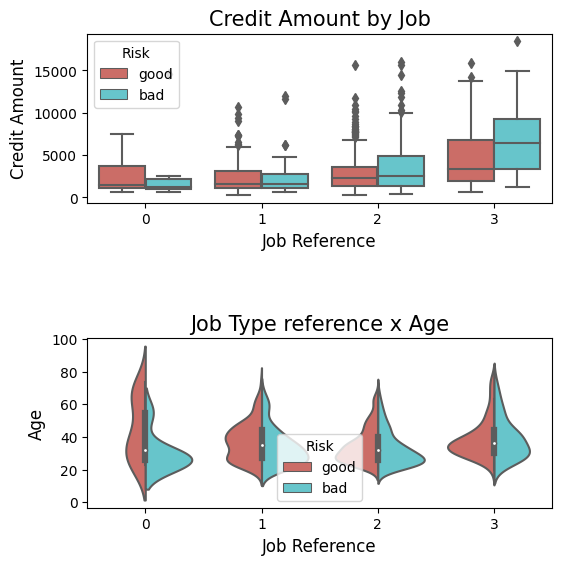

In [73]:
fig, ax = plt.subplots(figsize=(6,6), nrows=2)

g1 = sns.boxplot(x="Job", y="Credit amount", data=df_credit,
            palette="hls", ax=ax[0], hue="Risk")
g1.set_title("Credit Amount by Job", fontsize=15)
g1.set_xlabel("Job Reference", fontsize=12)
g1.set_ylabel("Credit Amount", fontsize=12)

g2 = sns.violinplot(x="Job", y="Age", data=df_credit, ax=ax[1],
               hue="Risk", split=True, palette="hls")
g2.set_title("Job Type reference x Age", fontsize=15)
g2.set_xlabel("Job Reference", fontsize=12)
g2.set_ylabel("Age", fontsize=12)

plt.subplots_adjust(hspace = 0.8,top = 0.9)

plt.show()


* Группы 1 и 2 имеют много выбросов.
* Вторая группа самая активно участвующая в кредитовании.
* По ней можно сказать что повышенный риск (Bad) относится к большим суммам.

### Исследование по длительности

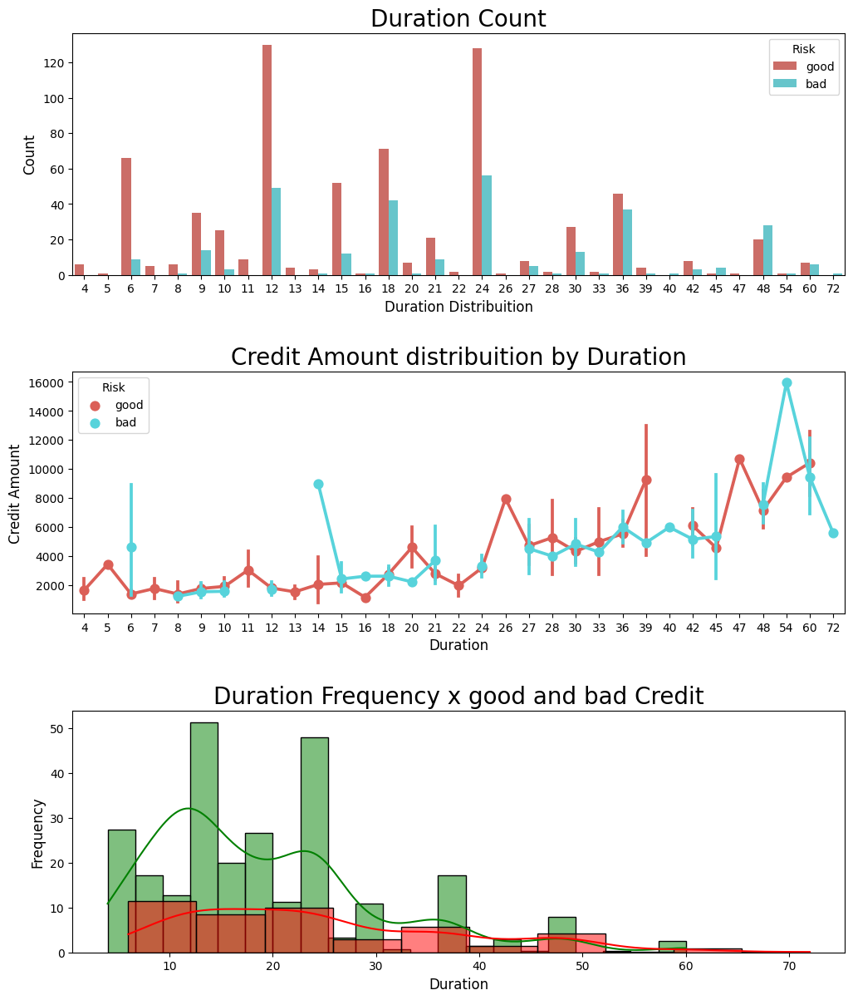

In [74]:
plt.figure(figsize = (12,14))

g= plt.subplot(311)
g = sns.countplot(x="Duration", data=df_credit,
              palette="hls",  hue = "Risk")
g.set_xlabel("Duration Distribuition", fontsize=12)
g.set_ylabel("Count", fontsize=12)
g.set_title("Duration Count", fontsize=20)

g1 = plt.subplot(312)
g1 = sns.pointplot(x="Duration", y ="Credit amount",data=df_credit,
                   hue="Risk", palette="hls")
g1.set_xlabel("Duration", fontsize=12)
g1.set_ylabel("Credit Amount", fontsize=12)
g1.set_title("Credit Amount distribuition by Duration", fontsize=20)

g2 = plt.subplot(313)
g2 = sns.histplot(df_good["Duration"], color='g',kde=True, stat="frequency")
g2 = sns.histplot(df_bad["Duration"], color='r',kde=True, stat="frequency")
g2.set_xlabel("Duration", fontsize=12)
g2.set_ylabel("Frequency", fontsize=12)
g2.set_title("Duration Frequency x good and bad Credit", fontsize=20)

plt.subplots_adjust(wspace = 0.4, hspace = 0.4,top = 0.9)

plt.show()

Люди берут чаще кредит на 12 , 18 и 24 месяца. Вот этом есть смысл год, полтора , два.

На большее время берут и больше денег.

По частоте на пол года и на полтора берут примерно c одинаковой частотой.  
Ровно как на год и на два. 

Но! На год чаще всего.

In [75]:
df_credit[(df_credit['Duration'] > 35) & (df_credit['Duration'] < 45)]['Purpose'].value_counts()

Purpose
car                    34
radio/TV               23
furniture/equipment    17
business               11
education              10
repairs                 3
domestic appliances     1
vacation/others         1
Name: count, dtype: int64

In [76]:
df_credit[df_credit['Duration'] > 45]['Purpose'].value_counts()

Purpose
car                    22
business               16
radio/TV               15
education               4
vacation/others         4
furniture/equipment     3
domestic appliances     1
Name: count, dtype: int64

In [77]:
df_credit[df_credit['Duration'] > 56]['Purpose'].value_counts()

Purpose
radio/TV           5
car                5
business           2
vacation/others    1
education          1
Name: count, dtype: int64

Интересно кто берет такие долгосрочные кредиты на radio/TV (>45) 

In [78]:
df_credit[(df_credit['Duration'] > 45) & (df_credit['Purpose'] == 'radio/TV')]['Age'].mean()

30.4

А вот на развитие бизнеса обращаются люди постарше

In [79]:
df_credit[(df_credit['Duration'] > 45) & (df_credit['Purpose'] == 'business')]['Age'].mean()

38.6875

Сводная таблица по типу работы и пола в данных

In [80]:
print(pd.crosstab(df_credit["Checking account"],df_credit.Sex))

Sex               female  male
Checking account              
little                88   186
moderate              86   183
new_client            23    76
no_acc                93   202
rich                  20    43


### Распределение Credit Amont

<Axes: >

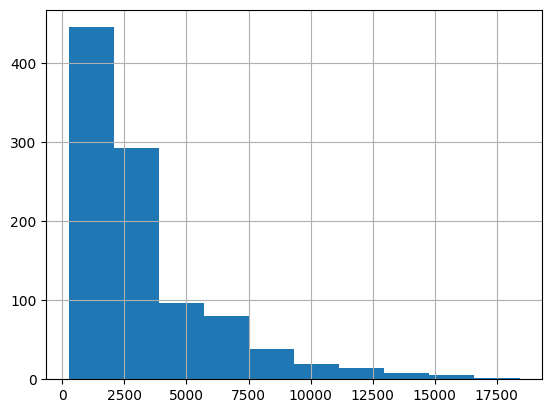

In [81]:
df_credit['Credit amount'].hist()

<Axes: >

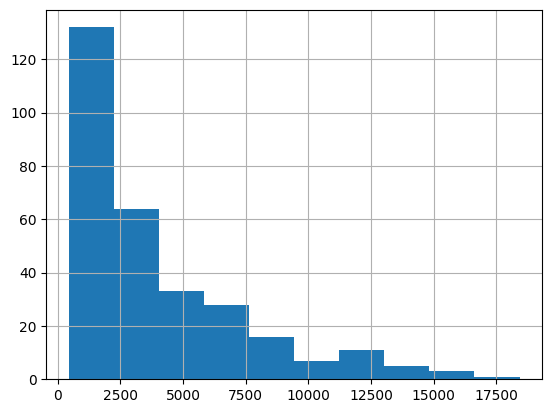

In [82]:
df_credit[df_credit['Risk'] == 'bad']['Credit amount'].hist()

<Axes: >

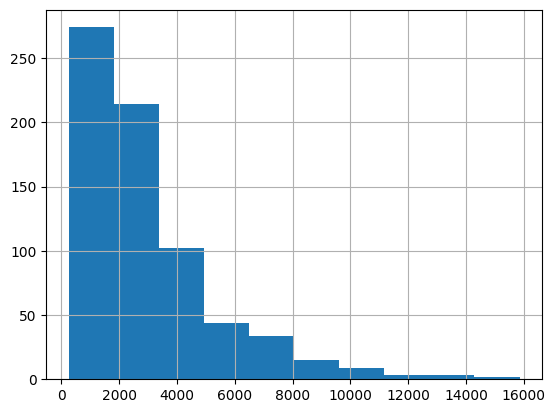

In [83]:
df_credit[df_credit['Risk'] == 'good']['Credit amount'].hist()

Примерно от велечины кредита == 10000 начинается повышенный риск. Посмотрим поближе.

<Axes: >

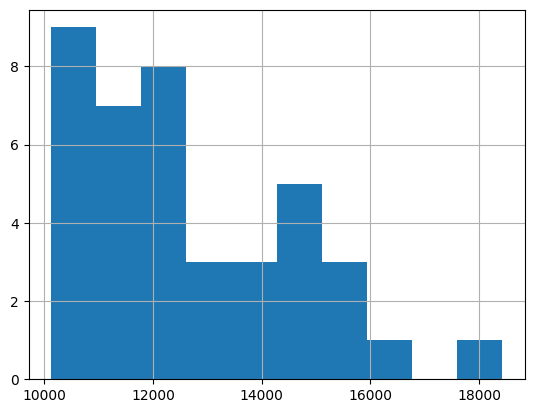

In [84]:
df_credit[df_credit['Credit amount'] > 10000]['Credit amount'].hist()

In [85]:
df_credit[(df_credit['Credit amount'] > 10000) & (df_credit['Risk'] == 'bad')].sample(5)

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk,Signal,Age_cat,newbie,isSave_exist,isCheck_exist
917,68,male,3,own,little,little,14896,6,car,bad,1,Senior_60+,0,1,1
378,57,male,3,free,little,moderate,14318,36,car,bad,1,Old_55-59,0,1,1
563,37,male,2,free,no_acc,moderate,12389,36,car,bad,1,Adult_28-37,0,0,1
763,30,male,3,free,new_client,new_client,12680,21,car,bad,1,Adult_28-37,1,0,0
226,27,male,2,own,rich,moderate,10961,48,radio/TV,bad,1,Young-24-27,0,1,1


In [86]:
df_credit[(df_credit['Credit amount'] > 10000) & (df_credit['Risk'] == 'good')].sample(5)

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Risk,Signal,Age_cat,newbie,isSave_exist,isCheck_exist
854,45,male,2,own,little,no_acc,10875,36,car,good,0,Juicy-38_48,0,1,0
657,37,male,2,own,new_client,new_client,10222,48,radio/TV,good,0,Adult_28-37,1,0,0
902,42,male,2,free,new_client,new_client,10477,36,car,good,0,Juicy-38_48,1,0,0
615,48,male,3,own,no_acc,moderate,12204,48,business,good,0,Juicy-38_48,0,0,1
450,30,male,3,own,new_client,new_client,11054,36,car,good,0,Adult_28-37,1,0,0


In [87]:
x1 = np.log(df_good['Credit amount'])
x2 = np.log(df_bad["Credit amount"])

hist_data = [x1, x2]

group_labels = ['Good Credit', 'Bad Credit']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)

py.iplot(fig)

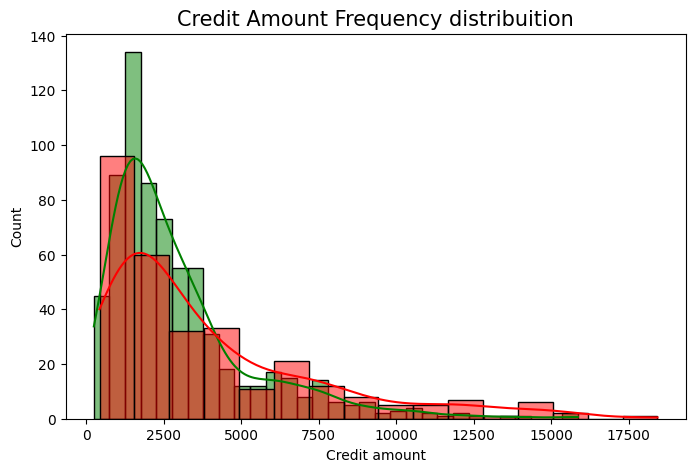

In [88]:
plt.figure(figsize = (8,5))

g= sns.histplot(df_good['Credit amount'], color='g', kde=True)
g = sns.histplot(df_bad["Credit amount"], color='r', kde=True)
g.set_title("Credit Amount Frequency distribuition", fontsize=15)
plt.show()

### Исследование назначения кредита

In [89]:
print("Values describe: ")
print(pd.crosstab(df_credit.Purpose, df_credit.Risk))

print("Values describe: ")
print((pd.crosstab(df_credit.Purpose, df_credit.Risk, normalize='index') * 100).round(1))

Values describe: 
Risk                 bad  good
Purpose                       
business              34    63
car                  106   231
domestic appliances    4     8
education             23    36
furniture/equipment   58   123
radio/TV              62   218
repairs                8    14
vacation/others        5     7
Values describe: 
Risk                  bad  good
Purpose                        
business             35.1  64.9
car                  31.5  68.5
domestic appliances  33.3  66.7
education            39.0  61.0
furniture/equipment  32.0  68.0
radio/TV             22.1  77.9
repairs              36.4  63.6
vacation/others      41.7  58.3


<Figure size 1000x600 with 0 Axes>

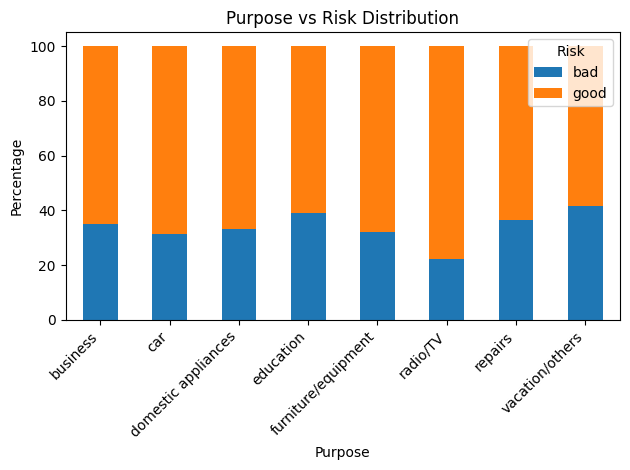

In [90]:
cross_tab = (pd.crosstab(df_credit.Purpose, df_credit.Risk, normalize='index') * 100).round(1)

plt.figure(figsize=(10, 6))
cross_tab.plot(kind='bar', stacked=True)

plt.title('Purpose vs Risk Distribution')
plt.xlabel('Purpose')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')

plt.legend(title='Risk', loc='upper right')

plt.tight_layout()  
plt.show() 

Какая доля плохих и хороших кредитов по назначению ?

In [91]:
df_credit['Purpose'].unique()
# Каждое значение стобца делим на сумму по столбцу
cross_purpose = pd.crosstab(df_credit['Purpose'], df_credit['Risk']).apply(lambda x: x/x.sum() * 100)
cross_purpose = cross_purpose.round(decimals=2)
cross_purpose.sort_values(by=['bad'])

Risk,bad,good
Purpose,,
domestic appliances,1.33,1.14
vacation/others,1.67,1.00
repairs,2.67,2.00
education,7.67,5.14
business,11.33,9.00
furniture/equipment,19.33,17.57
radio/TV,20.67,31.14
car,35.33,33.00


Чаще всего берут кредит на машину и в процентном соотношении он чаще имеет risk Bad.

Также furniture/equipment	19.33  
business	11.33  
education	7.67  

Самый большой разрыв разницы 20.67 и 31.14 у радио и ТВ

In [92]:
radio_tv = np.sum(df_credit['Credit amount'].loc[df_credit['Purpose'] == 'radio/TV'].values)
education = np.sum(df_credit['Credit amount'].loc[df_credit['Purpose'] == 'education'].values)
furniture = np.sum(df_credit['Credit amount'].loc[df_credit['Purpose'] == 'furniture/equipment'].values)
car = np.sum(df_credit['Credit amount'].loc[df_credit['Purpose'] == 'car'].values)
business = np.sum(df_credit['Credit amount'].loc[df_credit['Purpose'] == 'business'].values)
domestic_app = np.sum(df_credit['Credit amount'].loc[df_credit['Purpose'] == 'domestic appliances'].values)
repairs = np.sum(df_credit['Credit amount'].loc[df_credit['Purpose'] == 'repairs'].values)
vacation_others = np.sum(df_credit['Credit amount'].loc[df_credit['Purpose'] == 'vacation/others'].values)

df_purposes = pd.DataFrame(data=[[radio_tv, education, furniture, car, business, domestic_app, repairs, vacation_others]],
                          columns=df_credit["Purpose"].unique())

print(df_purposes)

data = [
    go.Scatterpolar(
        r = [radio_tv, education, furniture,car, business, domestic_app, repairs, vacation_others],
        theta = df_credit['Purpose'].unique().tolist(),
        line = dict(
            color = "#ff7f50"
        ),
        mode = 'lines+markers',
        fill='toself',
        marker = dict(
            color = '#8090c7',
            symbol='square',
            size=6
        )
    )
]

layout = go.Layout(
    showlegend = False,
    title= "Распределение Кредитов по Целям",
    paper_bgcolor = "rgb(255, 245, 250)"
)

fig = dict(data=data, layout=layout)
py.iplot(fig, filename = 'polar/basic')

   radio/TV  education  furniture/equipment      car  business  \
0    696543     169873               555125  1269881    403330   

   domestic appliances  repairs  vacation/others  
0                17976    60018            98512  


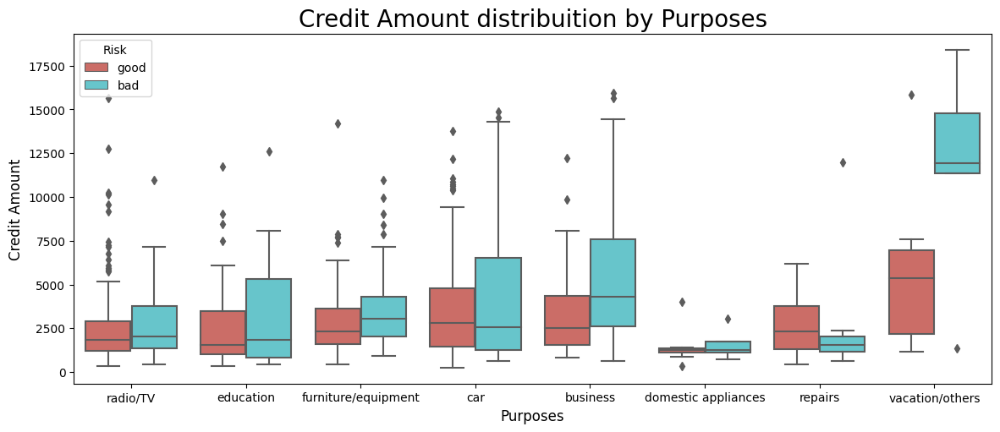

In [93]:
plt.figure(figsize = (14,6))

plt.subplot(111)
g2 = sns.boxplot(x="Purpose", y="Credit amount", data=df_credit,
               palette="hls", hue = "Risk")
g2.set_xlabel("Purposes", fontsize=12)
g2.set_ylabel("Credit Amount", fontsize=12)
g2.set_title("Credit Amount distribuition by Purposes", fontsize=20)

plt.subplots_adjust(hspace = 0.6, top = 0.8)

plt.show()

In [94]:
cross_credit = df_credit.groupby(['Risk', 'Purpose'], as_index=False)['Credit amount'].sum()

purposes = df_credit['Purpose'].unique().tolist()
purposes = sorted(purposes)

good_amnt = cross_credit["Credit amount"].loc[cross_credit["Risk"] == "good"].values.tolist()
bad_amnt = cross_credit["Credit amount"].loc[cross_credit["Risk"] == "bad"].values.tolist()

good_risk = {"x": good_amnt, 
          "y": purposes, 
          "marker": {"color": "rgb(28, 98, 98)", "size": 12}, 
          "mode": "markers", 
          "name": "Good Risk", 
          "type": "scatter"
}

bad_risk = {"x": bad_amnt, 
          "y": purposes, 
          "marker": {"color": "rgb(98, 28, 28)", "size": 12}, 
          "mode": "markers", 
          "name": "Bad Risk", 
          "type": "scatter", 
}

data = [good_risk, bad_risk]
layout = {"title": "Credit Loan Applications by Purpose", 
          "xaxis": {"title": "Credit Amount Borrowed", }, 
          "yaxis": {"title": ""},
#          "width": 800,
#          "height": 700
         }

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='basic_dot-plot')

Видимо люди берут деньги в кредит на отпуск и не возвращаются xd

Если просумировать все суммы выданных кредитов то именно vacation/others наиболее убыточны, но такие выводы могут складываться из-за того что этой категории назначения кредита представленно в данных меньше всего.

В данных присутствует дисбаланс по назначению кредита. В них люди чаще берут кредит на  :

business  
furniture/equipment  
radio/TV  
car	  

Резюме:
* Автомобили, радио/телевизоры и мебель и оборудование  а также бизнесс составили более 50 % общего риска и имеют самое высокое распределение выданных кредитов.
* Остальные цели были нечастыми целями при подаче заявки на кредит.
* Цели "автомобили" и "радио/телевизоры" были менее рискованными с операционной точки зрения, так как между хорошим и плохим риском в суммарно выданных средствах была самая большая разница.

<h4>На что берут кредиты женщины и мужчины чаще всего</h4>

In [95]:
date_int = ["Purpose", 'Sex']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(df_credit[date_int[0]], df_credit[date_int[1]]).style.background_gradient(cmap = cm)

Sex,female,male
Purpose,,
business,19,78
car,94,243
domestic appliances,6,6
education,24,35
furniture/equipment,74,107
radio/TV,85,195
repairs,5,17
vacation/others,3,9


In [96]:
df_credit['Sex'].value_counts()

Sex
male      690
female    310
Name: count, dtype: int64

In [97]:
(85/310) * 100

27.419354838709676

In [98]:
(195/690) * 100

28.26086956521739

<b><h3>Target</h3></b>

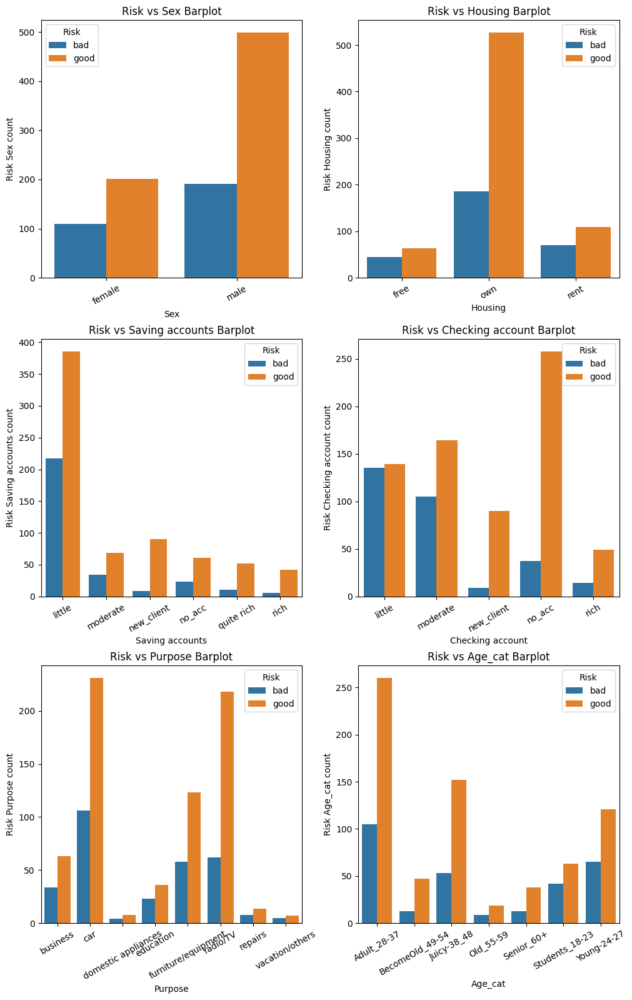

In [99]:
risk_vs_cats(df_credit,exceptions=['Risk','Signal'])

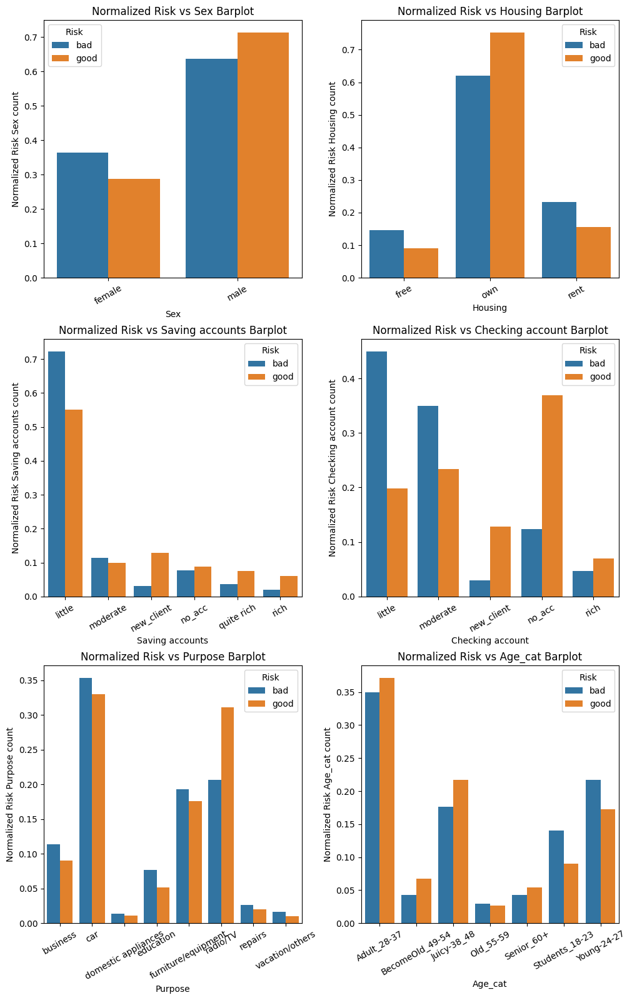

In [100]:
risk_vs_cats_normed(df_credit,exceptions=['Risk','Signal'])

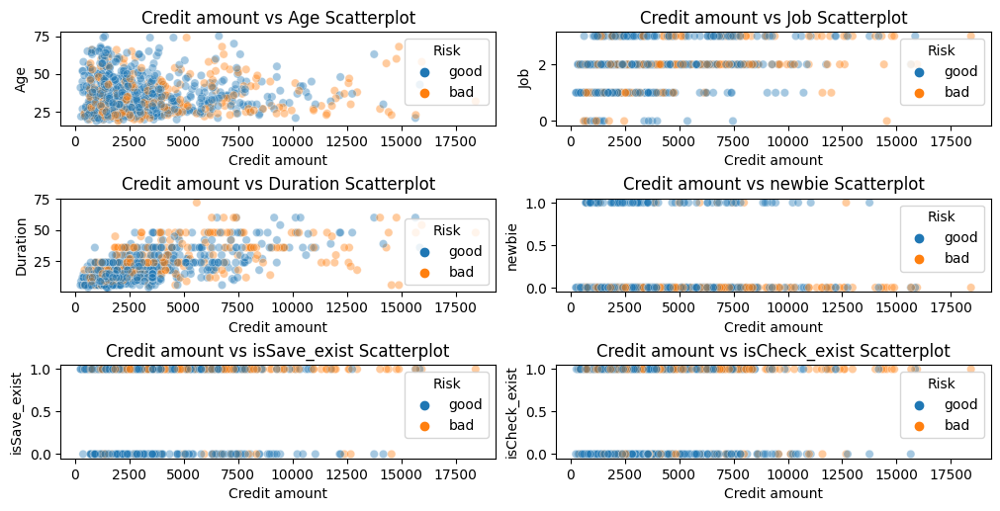

In [101]:
risk_vs_nums(df_credit,exceptions=['Signal','Credit amount'])

Портрет клиента с низким сигналом (Bad Signal)

Исследование клиентов с низким т.е. Bad сигналом позволяет выделить следующие характеристики:

* Предпочтение долгосрочных кредитов: Клиенты с низким сигналом склонны брать кредиты на короткие сроки и в больших суммах. Это может создавать риски для банка, так как клиенты могут столкнуться с трудностями при возврате больших сумм за короткий срок.

* Молодой возраст (23-25 лет): Большинство клиентов с низким сигналом молодые (23-25 лет), что может указывать на их недостаточный опыт в области кредитования и финансов.

* Типы кредитов: Кредиты на образование и отдых представляют наибольший риск для банка, возможно, из-за финансовой нестабильности этой категории.

**Good insights :**

* Минимальный риск для банка составляют кредиты на срок около 2,5 года.

* Недвижимость: Клиенты с собственным жильем более надежны для возврата кредита, чем те, кто арендует жилье.

* Новые клиенты банка обычно показывают высокую надежность в выплате кредита.

* Клиенты, у которых отсутствует checking account в банке, более надежны в вопросах возврата кредита.

### Создание признаков и формирование обущающего датасета

In [102]:
df = df_credit.copy()

In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Age               1000 non-null   int64 
 1   Sex               1000 non-null   object
 2   Job               1000 non-null   int64 
 3   Housing           1000 non-null   object
 4   Saving accounts   1000 non-null   object
 5   Checking account  1000 non-null   object
 6   Credit amount     1000 non-null   int64 
 7   Duration          1000 non-null   int64 
 8   Purpose           1000 non-null   object
 9   Risk              1000 non-null   object
 10  Signal            1000 non-null   int64 
 11  Age_cat           1000 non-null   object
 12  newbie            1000 non-null   int64 
 13  isSave_exist      1000 non-null   int64 
 14  isCheck_exist     1000 non-null   int64 
dtypes: int64(8), object(7)
memory usage: 125.0+ KB


In [104]:
# df['newbie'] = df['newbie'].astype('bool')
# df['isCheck_exist'] = df['isCheck_exist'].astype(bool)
# df['isSave_exist'] = df['isSave_exist'].astype(bool)
# df['Signal'] = df['Signal'].astype(bool)

In [105]:
categorical_columns = ['Age_cat','Sex', 'Job', 'Housing', 'Saving accounts', 'Checking account', 'Purpose','Signal','isSave_exist','isCheck_exist','newbie']
df[categorical_columns] = df[categorical_columns].astype('category')

In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Age               1000 non-null   int64   
 1   Sex               1000 non-null   category
 2   Job               1000 non-null   category
 3   Housing           1000 non-null   category
 4   Saving accounts   1000 non-null   category
 5   Checking account  1000 non-null   category
 6   Credit amount     1000 non-null   int64   
 7   Duration          1000 non-null   int64   
 8   Purpose           1000 non-null   category
 9   Risk              1000 non-null   object  
 10  Signal            1000 non-null   category
 11  Age_cat           1000 non-null   category
 12  newbie            1000 non-null   category
 13  isSave_exist      1000 non-null   category
 14  isCheck_exist     1000 non-null   category
dtypes: category(11), int64(3), object(1)
memory usage: 51.9+ KB


In [107]:
## Удаляем лишние столбцы
df = df.drop(columns=['Risk']) 

In [108]:
NUM, CAT = feature_type(df)
NUM, CAT

(['Age', 'Credit amount', 'Duration'],
 ['Sex',
  'Job',
  'Housing',
  'Saving accounts',
  'Checking account',
  'Purpose',
  'Signal',
  'Age_cat',
  'newbie',
  'isSave_exist',
  'isCheck_exist'])

C:\Users\johnw\AppData\Local\Temp\ipykernel_14468\1613642007.py:11: UserWarning:

The figure layout has changed to tight



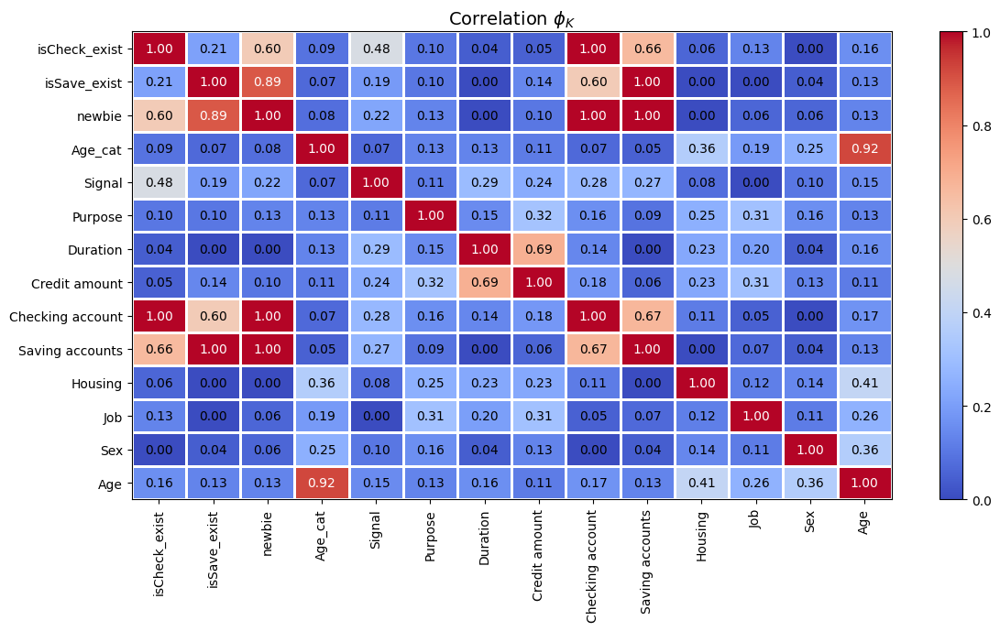

In [109]:
interval_cols = ['Age', 'Credit amount', 'Duration']
corr_matrix(df,interval_cols)

Согласно полученной матрице корреляций, утечка целевого признака не обнаружена. Однако видна сильная корреляция между следующими признаками:

* Checking и Saving account по понятным причинам сильно коррелируют. Потому как есть случай когда отсутствие обоих ведет к активации категории "newbies"
* Возраст и тип жилья по понятным причинам корелируют ровно как длительность кредита и его сумма.

По причине наличия мультиколлинеарности используемые модели должны содержать в себе возможность применения регуляризации.



**Финальный вид датасета, из которого будут отобраны признаки для обучения:**

In [110]:
df.sample(5, random_state=RANDOM_STATE)

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Signal,Age_cat,newbie,isSave_exist,isCheck_exist
21,44,male,2,rent,quite rich,little,2647,6,radio/TV,0,Juicy-38_48,0,1,1
562,29,female,2,own,little,rich,683,6,radio/TV,0,Adult_28-37,0,1,1
526,31,female,2,own,moderate,no_acc,1532,15,education,0,Adult_28-37,0,1,0
700,29,female,1,rent,quite rich,no_acc,1123,12,furniture/equipment,1,Adult_28-37,0,1,0
57,31,female,2,own,little,no_acc,9566,36,radio/TV,0,Adult_28-37,0,1,0


### Вывод по разделу

В рамках разведочного анализа данных была изучена таблица, сформирован столбец таргета, оптимизированы типы данных и удалены пропуски. Произведено графическое исследование данных, позволившее установить зависимости, связанные с кредитованием, а также сформирован портрет плохого и хорошо сигнала на креитование.

# **5. Построение модели** 

### Формирование выборок

In [111]:
X = df.drop(columns=['Signal'])
y = df.Signal

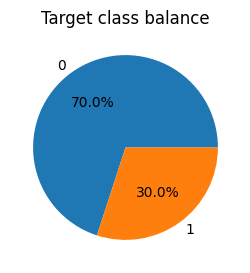

In [112]:
plt.figure(figsize=(3, 3))
plt.title('Target class balance')
plt.pie(y.value_counts(), labels=[0, 1], autopct='%1.1f%%');

In [113]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE, stratify=y)

In [114]:
y

0      0
1      1
2      0
3      0
4      1
      ..
995    0
996    0
997    0
998    1
999    0
Name: Signal, Length: 1000, dtype: category
Categories (2, int64): [0, 1]

In [115]:
y_test

121    0
302    1
916    0
248    0
864    1
      ..
568    0
750    0
509    0
459    0
335    1
Name: Signal, Length: 200, dtype: category
Categories (2, int64): [0, 1]

In [116]:
df.columns

Index(['Age', 'Sex', 'Job', 'Housing', 'Saving accounts', 'Checking account',
       'Credit amount', 'Duration', 'Purpose', 'Signal', 'Age_cat', 'newbie',
       'isSave_exist', 'isCheck_exist'],
      dtype='object')

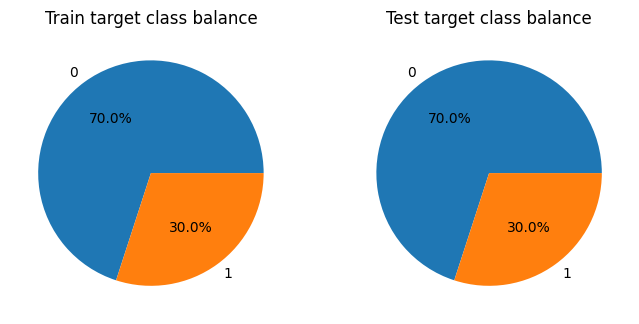

In [117]:
fig = plt.figure(figsize=(8, 4))
fig.add_subplot(1, 2, 1)
plt.title('Train target class balance')
plt.pie(y_train.value_counts(), labels=[0, 1], autopct='%1.1f%%')

fig.add_subplot(1, 2, 2)
plt.title('Test target class balance')
plt.pie(y_test.value_counts(), labels=[0, 1], autopct='%1.1f%%');

Баланс между классами в выборках сохранен. Для обработки дисбаланса классов воспользуемся встроенными методами, где это позволяет сделать модель. 

In [118]:
print(X_train.shape)
X_train.sample(5, random_state=RANDOM_STATE)

(800, 13)


,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Age_cat,newbie,isSave_exist,isCheck_exist
753,25,female,2,own,little,no_acc,5771,30,radio/TV,Young-24-27,0,1,0
416,33,male,1,own,little,little,2579,12,car,Adult_28-37,0,1,1
238,35,female,2,own,little,no_acc,1291,12,radio/TV,Adult_28-37,0,1,0
139,44,female,1,rent,little,rich,1881,12,radio/TV,Juicy-38_48,0,1,1
624,65,male,2,free,little,little,2600,18,radio/TV,Senior_60+,0,1,1


### Формирование пайплайнов

In [119]:
NUM, CAT = feature_type(X_train)
print('Num: ',NUM)
print('Categorical: ',CAT)

Num:  ['Age', 'Credit amount', 'Duration']
Categorical:  ['Sex', 'Job', 'Housing', 'Saving accounts', 'Checking account', 'Purpose', 'Age_cat', 'newbie', 'isSave_exist', 'isCheck_exist']


In [120]:
col_ohe_transformer = ColumnTransformer(
    [('cat', OneHotEncoder(), CAT),
     ('std', StandardScaler(), NUM)],
    remainder='passthrough'
)

In [121]:
col_oe_transformer = ColumnTransformer(
    [('cat', OrdinalEncoder(), CAT),
     ('std', StandardScaler(), NUM)],
    remainder='passthrough'
)

In [122]:
dummy_pipe = Pipeline(
    [('cat', col_ohe_transformer),
     ('dummy', DummyClassifier())]
)

Models

In [194]:
lr_pipe = Pipeline(
    [('ohe_std', col_oe_transformer),
     ('lregres', LogisticRegression())]
)

In [195]:
lda_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('lda', LinearDiscriminantAnalysis())]
)

In [196]:
lda_pipe_2 = Pipeline(
    [('oe_std', col_oe_transformer),
     ('lda', LinearDiscriminantAnalysis())]
)

In [197]:
rforest_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('rforest', RandomForestClassifier())]
)

In [198]:
cart_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('cart', DecisionTreeClassifier())]
)

In [199]:
lgbm_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('lgbm', LGBMClassifier())]
)

In [200]:
knn_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('knn', KNeighborsClassifier())]
)

In [201]:
svm_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('svm', SVC(gamma='auto'))]
)

In [202]:
nb_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('nb', GaussianNB())]
)

In [203]:
xgb_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('xgb', XGBClassifier())]
)

In [204]:
cboost_pipe = Pipeline(
    [('oe_std', col_oe_transformer),
     ('cboost', CatBoostClassifier())]
)

### Определение гипер-параметров

In [205]:
lr_params = {
    'lregres__solver':['liblinear'],
    'lregres__penalty':['l2'],
    'lregres__C':[0.1, 0.5, 1, 3],
    'lregres__class_weight':['balanced'],
    'lregres__random_state':[RANDOM_STATE]
}

In [206]:
lda_params = {
    'lda__solver': ['svd'],
}

In [207]:
lda_pipe_2_params = {
    'lda__solver': ['lsqr','eigen'],
    'lda__shrinkage': ['auto', None],
}

In [208]:
rforest_params = {
    'rforest__n_estimators':[1000],
    'rforest__max_depth':[6, 8, 10, 12, 14],
    'rforest__random_state':[RANDOM_STATE],
    'rforest__class_weight':['balanced'],
    'rforest__min_samples_split':[2, 3], 
    'rforest__min_samples_leaf':[1, 2] 
}

In [209]:
lgbm_params = {
    'lgbm__max_depth':[5,8],
    'lgbm__learning_rate':[1e-2],
    'lgbm__n_estimators':[500, 1000],
    'lgbm__reg_alpha':[0, 0.1, 0.2],
    'lgbm__reg_lambda':[0, 0.1, 0.2],
    'lgbm__class_weight':['balanced'],
    'lgbm__random_state':[RANDOM_STATE]
}


In [210]:
knn_params = {
    'knn__n_neighbors': [2, 3, 5, 7],
}

In [211]:
nb_params = {}

In [212]:
svm_params = {
    'svm__C': [0.1, 1.0],
    'svm__kernel': ['linear', 'rbf'],
}


In [213]:
xgb_params = {
    'xgb__learning_rate': [0.01, 0.1],
    'xgb__n_estimators': [100, 200],
    'xgb__max_depth': [3, 5],
}


In [214]:
cart_params = {
    'cart__max_depth': [None, 5, 10],
}

In [215]:
cboost_params = {
    'cboost__depth':[6, 8, 10], 
    'cboost__random_strength':[2],
    'cboost__learning_rate':[1e-3],
    'cboost__verbose':[False],
    'cboost__random_seed':[RANDOM_STATE],
}


### Обучение моделей

In [216]:

# search_names = ['lregres_search','cboost_search','LR', 'LDA', 'KNN', 'CART', 'NB', 'SVM', 'XGB']
# search_pipes = [lregres_pipe, rforest_pipe, lgbm_pipe, cboost_pipe, lr_pipe, lda_pipe, knn_pipe, cart_pipe, nb_pipe, svm_pipe, xgb_pipe]
# search_params = [lregres_params, cboost_params]


In [217]:
search_names = ['LR', 'LDA','LDA2','KNN', 'CART', 'NB', 'SVM', 'XGB','cboost_search','rforest_search', 'lgbm_search']
search_pipes = [lr_pipe, lda_pipe, lda_pipe_2, knn_pipe, cart_pipe, nb_pipe, svm_pipe, xgb_pipe,cboost_pipe,rforest_pipe, lgbm_pipe,]
search_params = [lr_params, lda_params, lda_pipe_2_params, knn_params, cart_params, nb_params, svm_params, xgb_params,cboost_params,rforest_params, lgbm_params,]

# 'cboost_search','rforest_search', 'lgbm_search',
# cboost_pipe,rforest_pipe, lgbm_pipe,

In [218]:
models = {}
search_score = []
results = []  # Список для хранения оценок для каждой модели
names = []  
searches = {} # Список для хранения названий моделей

for (i, pipe), params in zip(enumerate(search_pipes), search_params):
    search = GridSearchCV(
        pipe,
        params,
        cv=5,
        scoring='recall',  #recall
        error_score='raise',
        verbose=3
    )

    search.fit(X_train, y_train)

    searches[search_names[i]] = search  # Сохраняем результаты поиска
    results.append(search.best_score_)  # Сохраняем оценку для графика
    names.append(search_names[i])       # Сохраняем название модели

    
    
    print('\n'*2)
    for _ in range(5):
        print('='*79)
    print(f'{search_names[i]} best score')
    print(search.best_score_)
    for _ in range(5):
        print('='*79)
    print('\n'*2)
    
    models[search_names[i]] = search.best_estimator_
    search_score.append(search.best_score_.round(4))


for _ in range(5):
    print('='*79)
print('Cross-Validation Score')
display(pd.DataFrame(search_score, columns=['score'], index=[search_names]).sort_values(by='score', ascending=False))
for _ in range(5):
    print('='*79)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END lregres__C=0.1, lregres__class_weight=balanced, lregres__penalty=l2, lregres__random_state=345777, lregres__solver=liblinear;, score=0.792 total time=   0.0s
[CV 2/5] END lregres__C=0.1, lregres__class_weight=balanced, lregres__penalty=l2, lregres__random_state=345777, lregres__solver=liblinear;, score=0.708 total time=   0.0s
[CV 3/5] END lregres__C=0.1, lregres__class_weight=balanced, lregres__penalty=l2, lregres__random_state=345777, lregres__solver=liblinear;, score=0.667 total time=   0.0s
[CV 4/5] END lregres__C=0.1, lregres__class_weight=balanced, lregres__penalty=l2, lregres__random_state=345777, lregres__solver=liblinear;, score=0.750 total time=   0.0s
[CV 5/5] END lregres__C=0.1, lregres__class_weight=balanced, lregres__penalty=l2, lregres__random_state=345777, lregres__solver=liblinear;, score=0.729 total time=   0.0s
[CV 1/5] END lregres__C=0.5, lregres__class_weight=balanced, lregres__penalty=l2, lre

[CV 4/5] END ................knn__n_neighbors=2;, score=0.125 total time=   0.0s
[CV 5/5] END ................knn__n_neighbors=2;, score=0.167 total time=   0.0s
[CV 1/5] END ................knn__n_neighbors=3;, score=0.417 total time=   0.0s
[CV 2/5] END ................knn__n_neighbors=3;, score=0.417 total time=   0.0s
[CV 3/5] END ................knn__n_neighbors=3;, score=0.375 total time=   0.0s
[CV 4/5] END ................knn__n_neighbors=3;, score=0.312 total time=   0.0s
[CV 5/5] END ................knn__n_neighbors=3;, score=0.375 total time=   0.0s
[CV 1/5] END ................knn__n_neighbors=5;, score=0.479 total time=   0.0s
[CV 2/5] END ................knn__n_neighbors=5;, score=0.312 total time=   0.0s
[CV 3/5] END ................knn__n_neighbors=5;, score=0.292 total time=   0.0s
[CV 4/5] END ................knn__n_neighbors=5;, score=0.333 total time=   0.0s
[CV 5/5] END ................knn__n_neighbors=5;, score=0.438 total time=   0.0s
[CV 1/5] END ...............

[CV 4/5] END xgb__learning_rate=0.01, xgb__max_depth=3, xgb__n_estimators=100;, score=0.312 total time=   0.0s
[CV 5/5] END xgb__learning_rate=0.01, xgb__max_depth=3, xgb__n_estimators=100;, score=0.250 total time=   0.0s
[CV 1/5] END xgb__learning_rate=0.01, xgb__max_depth=3, xgb__n_estimators=200;, score=0.396 total time=   0.0s
[CV 2/5] END xgb__learning_rate=0.01, xgb__max_depth=3, xgb__n_estimators=200;, score=0.208 total time=   0.0s
[CV 3/5] END xgb__learning_rate=0.01, xgb__max_depth=3, xgb__n_estimators=200;, score=0.229 total time=   0.0s
[CV 4/5] END xgb__learning_rate=0.01, xgb__max_depth=3, xgb__n_estimators=200;, score=0.354 total time=   0.0s
[CV 5/5] END xgb__learning_rate=0.01, xgb__max_depth=3, xgb__n_estimators=200;, score=0.312 total time=   0.0s
[CV 1/5] END xgb__learning_rate=0.01, xgb__max_depth=5, xgb__n_estimators=100;, score=0.417 total time=   0.0s
[CV 2/5] END xgb__learning_rate=0.01, xgb__max_depth=5, xgb__n_estimators=100;, score=0.250 total time=   0.0s
[

[CV 1/5] END rforest__class_weight=balanced, rforest__max_depth=6, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.708 total time=   1.3s
[CV 2/5] END rforest__class_weight=balanced, rforest__max_depth=6, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.667 total time=   1.4s
[CV 3/5] END rforest__class_weight=balanced, rforest__max_depth=6, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.604 total time=   1.3s
[CV 4/5] END rforest__class_weight=balanced, rforest__max_depth=6, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.729 total time=   1.3s
[CV 5/5] END rforest__class_weight=balanced, rforest__max_depth=6, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rforest__n

[CV 4/5] END rforest__class_weight=balanced, rforest__max_depth=8, rforest__min_samples_leaf=2, rforest__min_samples_split=3, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.688 total time=   1.5s
[CV 5/5] END rforest__class_weight=balanced, rforest__max_depth=8, rforest__min_samples_leaf=2, rforest__min_samples_split=3, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.583 total time=   1.4s
[CV 1/5] END rforest__class_weight=balanced, rforest__max_depth=10, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.604 total time=   1.6s
[CV 2/5] END rforest__class_weight=balanced, rforest__max_depth=10, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.458 total time=   1.6s
[CV 3/5] END rforest__class_weight=balanced, rforest__max_depth=10, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rforest

[CV 2/5] END rforest__class_weight=balanced, rforest__max_depth=12, rforest__min_samples_leaf=2, rforest__min_samples_split=3, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.479 total time=   1.6s
[CV 3/5] END rforest__class_weight=balanced, rforest__max_depth=12, rforest__min_samples_leaf=2, rforest__min_samples_split=3, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.500 total time=   1.6s
[CV 4/5] END rforest__class_weight=balanced, rforest__max_depth=12, rforest__min_samples_leaf=2, rforest__min_samples_split=3, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.542 total time=   1.6s
[CV 5/5] END rforest__class_weight=balanced, rforest__max_depth=12, rforest__min_samples_leaf=2, rforest__min_samples_split=3, rforest__n_estimators=1000, rforest__random_state=345777;, score=0.521 total time=   1.6s
[CV 1/5] END rforest__class_weight=balanced, rforest__max_depth=14, rforest__min_samples_leaf=1, rforest__min_samples_split=2, rfore

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0;, score=0.625 total time=   0.0s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number of

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.729 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.2;, score=0.688 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0;, score=0.542 total time=   0.0s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0;, score=0.646 total time=   0.0s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0;, score=0.562 total time=   0.0s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.1;, score=0.708 total time=   0.0s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start tra

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0;, score=0.667 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start traini

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0;, score=0.583 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number o

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.688 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.521 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.604 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.688 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]:

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.583 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.2;, score=0.688 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.2;, score=0.542 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.2;, score=0.604 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0;, score=0.667 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0;, score=0.688 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0.1;, score=0.521 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, numb

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0.1;, score=0.583 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Num

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0.2;, score=0.667 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, numb

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0.2;, score=0.667 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0;, score=0.521 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0;, score=0.604 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0;, score=0.667 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]:

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0;, score=0.604 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.1;, score=0.604 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, numb

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.2;, score=0.667 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, numb

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.2;, score=0.646 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=5, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.2;, score=0.604 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, numb

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0;, score=0.646 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number of

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0;, score=0.521 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0;, score=0.625 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number of

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000111 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.1;, score=0.625 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, numbe

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.2;, score=0.667 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, numbe

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=500, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.2;, score=0.604 total time=   0.1s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, numbe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0;, score=0.479 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number o

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0;, score=0.479 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.625 total time=   0.3s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.562 total time=   0.4s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.1;, score=0.500 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.2;, score=0.479 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0, lgbm__reg_lambda=0.2;, score=0.500 total time=   0.3s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 1/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0;, score=0.604 total time=   0.3s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 327
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[CV 2/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0;, score=0.500 total time=   0.3s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start trai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 5/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0;, score=0.500 total time=   0.3s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 326
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.1, lgbm__reg_lambda=0.2;, score=0.604 total time=   0.3s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 3/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0;, score=0.521 total time=   0.3s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 323
[LightGBM] [Info] Number of data points in the train set: 640, number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0;, score=0.604 total time=   0.3s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[CV 4/5] END lgbm__class_weight=balanced, lgbm__learning_rate=0.01, lgbm__max_depth=8, lgbm__n_estimators=1000, lgbm__random_state=345777, lgbm__reg_alpha=0.2, lgbm__reg_lambda=0.2;, score=0.646 total time=   0.2s
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 192, number of negative: 448
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 640, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

,score
LR,0.7417
NB,0.7292
rforest_search,0.6792
lgbm_search,0.6542
XGB,0.4583
CART,0.4417
LDA2,0.4167
LDA,0.4000
KNN,0.3792
SVM,0.3125


In [297]:
display(pd.DataFrame(search_score, columns=['score'], index=[search_names]).sort_values(by='score', ascending=False))

,score
LR,0.7417
NB,0.7292
rforest_search,0.6792
lgbm_search,0.6542
XGB,0.4583
CART,0.4417
LDA2,0.4167
LDA,0.4000
KNN,0.3792
SVM,0.3125


In [219]:
models['LR']['lregres'].get_params()

{'C': 1,
 'class_weight': 'balanced',
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 345777,
 'solver': 'liblinear',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

Были обучены 4 классических модели машинного обучения, среди которых лучшей оказалсь модель на основе алгортима rforest. Показаны гипер-параметры, при которых результат был достигнут. Разделение на выборки произведено с учетом существующего дисбаланса классов. Во избежания утечки тестовой выборки, часть предобработки данных встроена в пайплайны. 

### Анализ лучшей модели

#### LR result

In [301]:
from sklearn.metrics import roc_auc_score, accuracy_score, average_precision_score

y_pred=models['LR'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
print(f'Accuracy {accuracy_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')

ROC-AUC 0.7071
Accuracy 0.67
PR AUC: 0.4365


In [302]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.61      0.72       140
           1       0.47      0.80      0.59        60

    accuracy                           0.67       200
   macro avg       0.67      0.71      0.66       200
weighted avg       0.76      0.67      0.68       200



In [303]:
conf_matrix_lr = confusion_matrix(y_test, y_pred)
conf_matrix_lr

array([[86, 54],
       [12, 48]], dtype=int64)

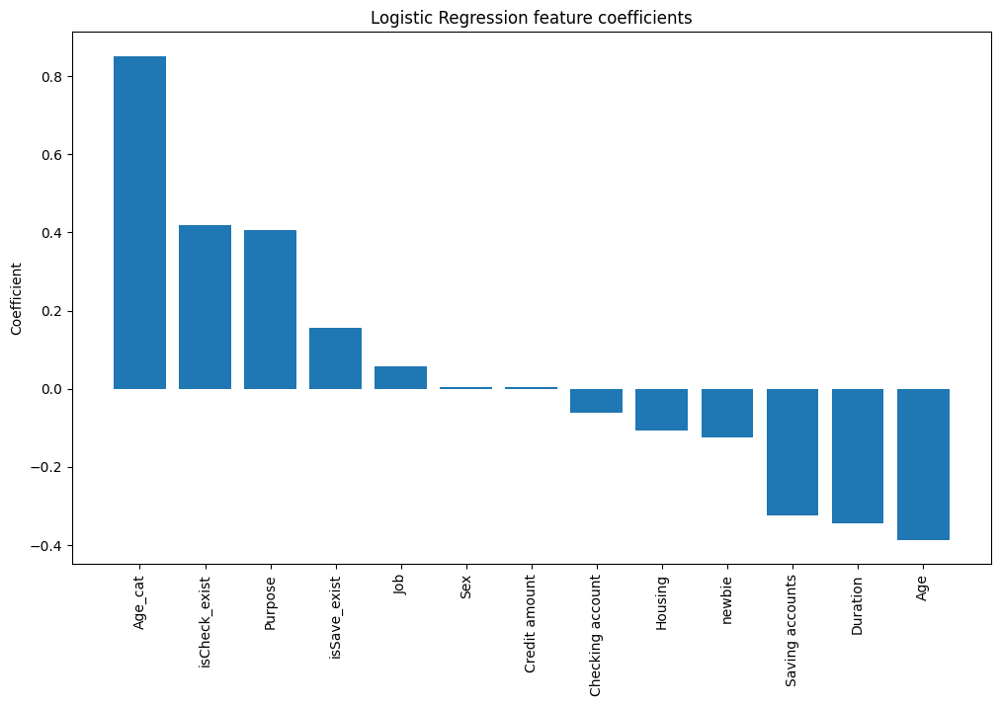

In [304]:
coefs = pd.DataFrame(data=models['LR']['lregres'].coef_[0],
                     index=X_train.columns,
                     columns=['coefficient']).sort_values(by='coefficient',
                                                         ascending=False)

plt.figure(figsize=(12, 7))
plt.bar(x=coefs.index, height=coefs.coefficient)
plt.xticks(rotation=90)
plt.title('Logistic Regression feature coefficients')
plt.ylabel('Coefficient')
plt.show()

#### GaussianNB result

In [305]:
y_pred=models['NB'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
print(f'Accuracy {accuracy_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')

print(classification_report(y_test, y_pred))

conf_matrix_nb = confusion_matrix(y_test, y_pred)
conf_matrix_nb


ROC-AUC 0.6893
Accuracy 0.665
PR AUC: 0.4229
              precision    recall  f1-score   support

           0       0.85      0.63      0.72       140
           1       0.46      0.75      0.57        60

    accuracy                           0.67       200
   macro avg       0.66      0.69      0.65       200
weighted avg       0.74      0.67      0.68       200



array([[88, 52],
       [15, 45]], dtype=int64)

#### Random forest

In [306]:
y_pred=models['rforest_search'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
print(f'Accuracy {accuracy_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')

ROC-AUC 0.7298
Accuracy 0.735
PR AUC: 0.4751


In [307]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.74      0.80       140
           1       0.54      0.72      0.62        60

    accuracy                           0.73       200
   macro avg       0.70      0.73      0.71       200
weighted avg       0.76      0.73      0.74       200



In [308]:
conf_matrix_rf = confusion_matrix(y_test, y_pred)
conf_matrix_rf

array([[104,  36],
       [ 17,  43]], dtype=int64)

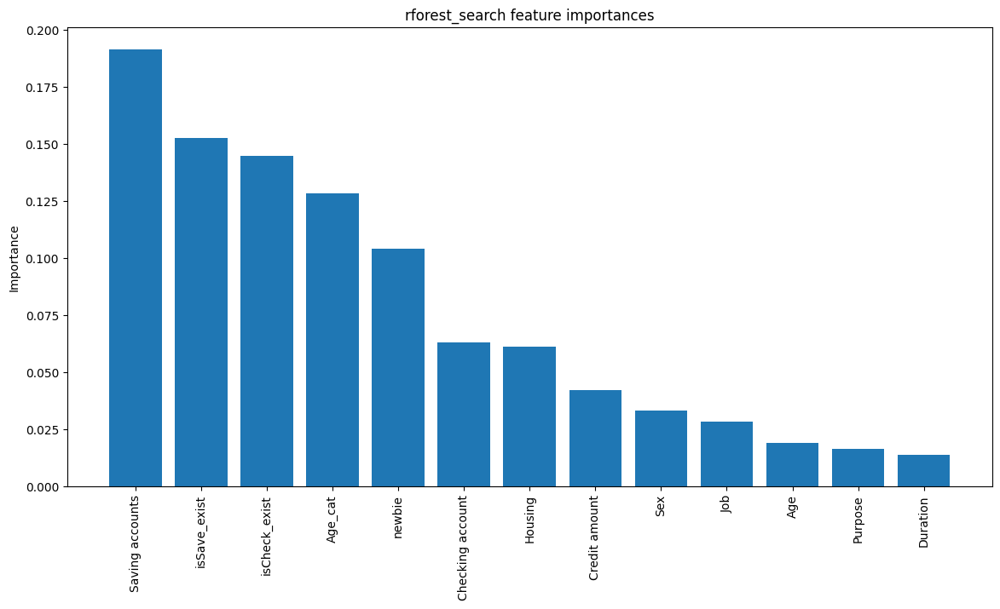

In [309]:
# Random forest features importance
fi = pd.DataFrame(data = models['rforest_search'][1].feature_importances_,
                  index=X_train.columns,
                  columns=['importance']).sort_values(by='importance',
                                                      ascending=False)

plt.figure(figsize=(14, 7))
plt.bar(x=fi.index, height=fi.importance)
plt.xticks(rotation=90)
plt.title('rforest_search feature importances')
plt.ylabel('Importance');

В данной задаче важнее показатель полнота она же recall , т.к. банку больнее потерять деньги с неверно выданного кредита, чем упустить "хорошего" клиента. Лучше не заработать, чем потерять конкретно в этом случае. 

Лучшие показатели по полноте дала модель random forest

### Матрица ошибок

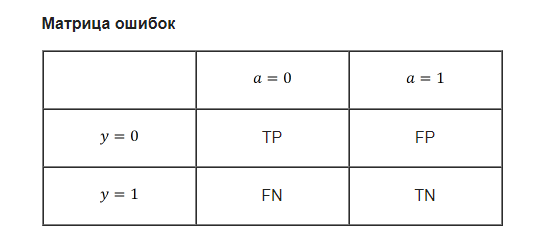

Поскольку с точки зрения логики задачи нам важнее правильно распознать некредитоспособного заёмщика с меткой y=1
, чем ошибиться в распознавании кредитоспособного, будем называть соответствующий исход классификации положительным (заёмщик некредитоспособен), а противоположный - отрицательным (заемщик кредитоспособен y=0
). Тогда возможны следующие исходы классификации:

y=1 Некридитоспособный
y=0 Кредитоспособный

* Некредитоспособный заёмщик классифицирован как некредитоспособный, т.е. положительный класс распознан как положительный. Наблюдения, для которых это имеет место называются истинно-положительными **(True Positive — TP)**.  

<center>TP=128</center>

* Кредитоспособный заёмщик классифицирован как кредитоспособный, т.е. отрицательный класс распознан как отрицательный. Наблюдения, которых это имеет место, называются истинно отрицательными **(True Negative — TN)**.

<center>TN=52</center>

* Кредитоспособный заёмщик классифицирован как некредитоспособный, т.е. имела место ошибка, в результате которой отрицательный класс был распознан как положительный. Т.е. мы не дали кредит тому кому можно было бы дать. Наблюдения, для которых был получен такой исход классификации, называются ложно-положительными **(False Positive — FP)**, а ошибка классификации называется **ошибкой I рода**.

<center>FP=47</center>

* Некредитоспособный заёмщик распознан как кредитоспособный, т.е. имела место ошибка, в результате которой положительный класс был распознан как отрицательный.Т.е. количество людей которым дали кредит, но не стоило бы. Наблюдения, для которых был получен такой исход классификации, называются ложно-отрицательными **(False Negative — FN)**, а ошибка классификации называется **ошибкой II рода**.

<center>FN=23</center>

**T** значит что класс предсказан правильно (соответственно **F** — неправильно).

In [310]:
print('Linear regression:','\n',conf_matrix_lr,'\n','Random forest:','\n',conf_matrix_rf)

Linear regression: 
 [[86 54]
 [12 48]] 
 Random forest: 
 [[104  36]
 [ 17  43]]


По умолчанию, в задаче бинарной классификации, модели будут предсказывать класс, который встречается чаще в обучающей выборке. Это обычно называется "положительным классом".

#### Где ошиблись?

В каких и в скольки значениях ошиблась модель?

In [311]:
# Прредсказанные значения Luinear regression  для тестовой выборки
y_pred = models['LR'].predict(X_test)
results_df = pd.DataFrame({'True Class': y_test, 'Predicted Class': y_pred})
# Add error validation == True
results_df['Error'] = results_df['True Class'] != results_df['Predicted Class']
results_df[results_df['Error'] == True].shape[0]

66

In [312]:
combined_df = pd.concat([df, results_df], axis=1)
combined_df['Error'] = combined_df['Error'].fillna(False)

#Строки с ошибками
error_rows = combined_df[combined_df['Error']]
error_rows.shape[0]

66

In [313]:
error_rows.sample(5)

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose,Signal,Age_cat,newbie,isSave_exist,isCheck_exist,True Class,Predicted Class,Error
750,49,female,2,own,little,little,428,6,furniture/equipment,0,BecomeOld_49-54,0,1,1,0,1.0,True
735,29,female,0,own,no_acc,moderate,3990,36,domestic appliances,0,Adult_28-37,0,0,1,0,1.0,True
213,66,male,3,own,little,rich,1908,30,business,1,Senior_60+,0,1,1,1,0.0,True
923,30,male,2,rent,little,moderate,2002,12,car,0,Adult_28-37,0,1,1,0,1.0,True
130,24,female,2,own,no_acc,moderate,8487,48,car,0,Young-24-27,0,0,1,0,1.0,True


#### ROC-AUC

In [316]:
y_proba_lr = models['LR'].predict_proba(X_test)
y_proba_nb = models['NB'].predict_proba(X_test)
y_proba_rf = models['rforest_search'].predict_proba(X_test)


Linear regression:
ROC-AUC 0.7071
PR AUC: 0.4365

Gaussian NB:
ROC-AUC 0.7071
PR AUC: 0.4365

Random forest
ROC-AUC 0.7298
PR AUC: 0.4751


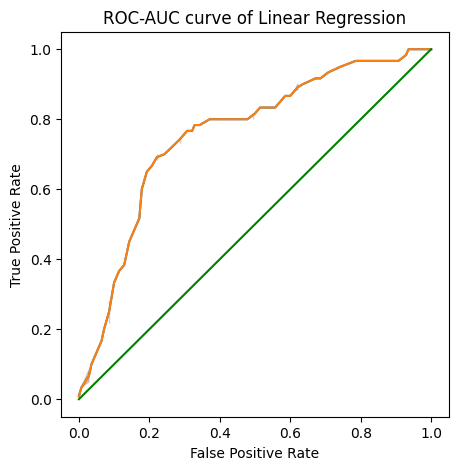

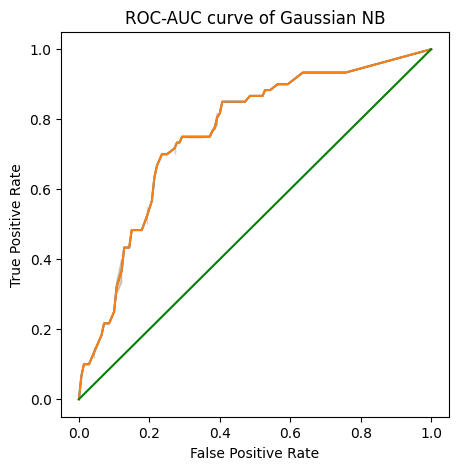

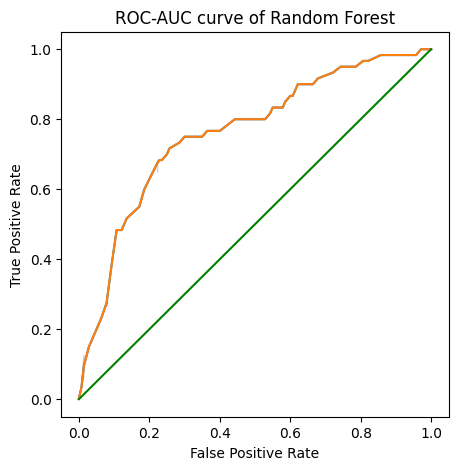

In [319]:
tpr, fpr = get_n_roc_coordinates(y_test, y_proba_lr, n=100)
plot_roc_curve(tpr, fpr, scatter=False, md_name='Linear Regression')

tpr, fpr = get_n_roc_coordinates(y_test, y_proba_nb, n=100)
plot_roc_curve(tpr, fpr, scatter=False, md_name='Gaussian NB')

tpr, fpr = get_n_roc_coordinates(y_test, y_proba_rf, n=100)
plot_roc_curve(tpr, fpr, scatter=False, md_name='Random Forest')

print('Linear regression:')
y_pred=models['LR'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')
print()
print('Gaussian NB:')
y_pred=models['LR'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')
print()
print('Random forest')
y_pred=models['rforest_search'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')

#### PR-AUC

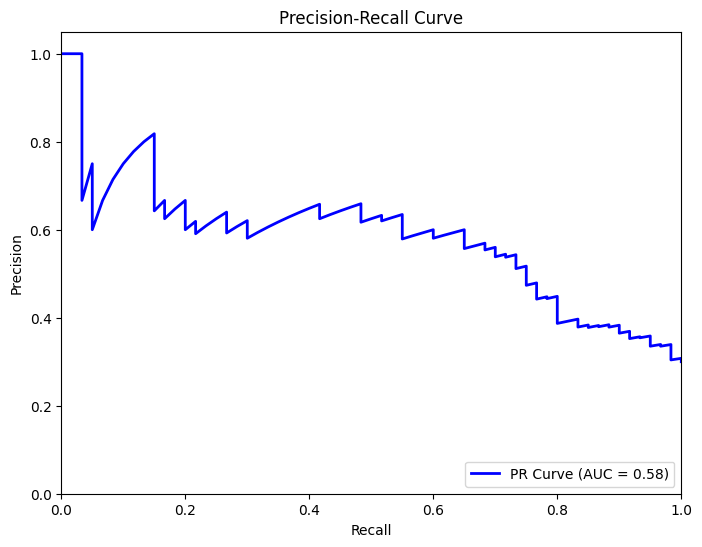

In [290]:
from sklearn.metrics import precision_recall_curve, auc
import matplotlib.pyplot as plt

# Extract probabilities for the positive class
y_proba_positive = y_proba_rf[:, 1]

# Calculate precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, y_proba_positive)

# Calculate PR AUC
pr_auc = auc(recall, precision)

# Plot PR curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label='PR Curve (AUC = %0.2f)' % pr_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower right")
plt.show()


### Интерпретация результатов

## Проверка константной моделью

In [271]:
dummy_pipe.fit(X_train, y_train);

ROC-AUC 0.5
PR AUC: 0.4479


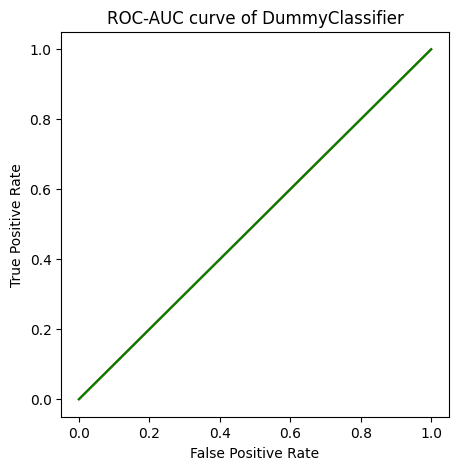

In [294]:
dummy_preds=dummy_pipe.predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, dummy_preds):.4}')

pr_auc = average_precision_score(y_test, y_pred_forest)
print(f'PR AUC: {pr_auc:.4f}')

dummy_proba = dummy_pipe.predict_proba(X_test)
# Calculates 100 coordinates of the ROC Curve
tpr, fpr = get_n_roc_coordinates(y_test, dummy_proba, n=100)
# Plots the ROC curve
plot_roc_curve(tpr, fpr, scatter=False, md_name='DummyClassifier')

In [318]:
print('Linear regression:')
y_pred=models['LR'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')
print()
print('Gaussian NB:')
y_pred=models['LR'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')
print()
print('Random forest')
y_pred=models['rforest_search'].predict(X_test)
print(f'ROC-AUC {roc_auc_score(y_test, y_pred):.4}')
pr_auc = average_precision_score(y_test, y_pred)
print(f'PR AUC: {pr_auc:.4f}')

Linear regression:
ROC-AUC 0.7071
PR AUC: 0.4365

Gaussian NB:
ROC-AUC 0.7071
PR AUC: 0.4365

Random forest
ROC-AUC 0.7298
PR AUC: 0.4751


In [323]:
print(conf_matrix_lr,'\n','\n',
      conf_matrix_nb,'\n','\n',
      conf_matrix_rf)

[[86 54]
 [12 48]] 
 
 [[88 52]
 [15 45]] 
 
 [[104  36]
 [ 17  43]]


In [324]:
54+12

66

In [325]:
52+15

67

In [326]:
36+12

48